## Simulation using generated transactions

Average trade frequency: 
- 1 swaps per 30 minute for Y
- 2 swaps per 30 minute fir X

The scale parameter for X has been adjusted accordingly (divided by 2).




### Applied Method II for parameter selection

<b>Below are illustrated in red the trade-size distribution parameters selected for running the simulation for each reserve range</b><br/>
The relative order of the plots in the visualization section (for each reserve range) resambles the position on the plot below. Note that the points in the bottom-right and top-left corners of each plot represent 'extreme' cases of traders behaviour which haven't been registered in the analyzed pools

<img src="../../../images/selected_params_II.png" width=600 height=600 />

## Set Up

In [55]:
import os
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import json

In [56]:
pd.set_option('max_columns', 101)
sns.set_theme()

In [57]:
EXPERIMENT_ID = 76

In [58]:
BASE_DIR = fr'..\..\..\data\simulated_transactions_grid_dist\experiment_{EXPERIMENT_ID}'
BASE_DIR

'..\\..\\..\\data\\simulated_transactions_grid_dist\\experiment_76'

In [59]:
X_NAME = 'X'
Y_NAME = 'Y'

TOKEN_0 = X_NAME
TOKEN_1 = Y_NAME

IS_SLIPPAGE_ENABLED = False

In [60]:
class Simulation:
    def __init__(self,):
        self.occ_min = None
        self.initial_reserve_usd = None
        self.ratio_sec_usd = None
        self.amount_in_std = None
        self.amount_in_Y_std = None
      #  self.blo
    

In [61]:
def find_longest_blocked_sequence(s: pd.Series):
    cnt = 0
    max_cnt = 0
    
    for index, value in s.items():
        if value != 'SUCCESS':
            cnt += 1
        else:
            max_cnt = max(max_cnt, cnt)
            cnt = 0
    
    return max(max_cnt, cnt)

In [74]:
def read_simulation_stats(folder):
    simulation = {}
    
    config_filename = os.path.join(folder, 'config.json')
    swaps_filename = os.path.join(folder, 'swaps_normalized.csv')
    pool_state_filename = os.path.join(folder, 'pool_after_transaction_normalized.csv')
    
    with open(config_filename) as f:
        simulation = json.load(f)
            
    pool_state_df = pd.read_csv(pool_state_filename)
    swaps_df = pd.read_csv(swaps_filename)
    
    swaps_df = swaps_df[swaps_df.status != 'PENDING']
        
    simulation['count'] = swaps_df.shape[0]
    simulation['blocked_transactions'] = (swaps_df.status != 'SUCCESS').sum()
    simulation['blocked_transactions_pct'] = simulation['blocked_transactions']/len(swaps_df)

    simulation['blocked_by_volatility_mitigator'] = (swaps_df.status == 'BLOCKED_BY_VOLATILITY_MITIGATION').sum()
    simulation['blocked_by_volatility_mitigator_pct'] = simulation['blocked_by_volatility_mitigator'] / simulation['blocked_transactions'] if simulation['blocked_transactions'] else None

    simulation['blocked_exceeded_slippage'] = (swaps_df.status == 'EXCEEDED_MAX_SLIPPAGE').sum()
    simulation['blocked_exceeded_slippage_pct'] = simulation['blocked_exceeded_slippage'] / simulation['blocked_transactions'] if simulation['blocked_transactions'] else None
    
    simulation['blocked_not_enough_reserves'] = (swaps_df.status == 'NOT_ENOUGH_RESERVES').sum()
    simulation['blocked_not_enough_reserves_pct'] = simulation['blocked_not_enough_reserves'] / simulation['blocked_transactions'] if simulation['blocked_transactions'] else None
    
    simulation['longest_blocked_sequence'] = find_longest_blocked_sequence(swaps_df.status)
    simulation['longest_blocked_sequence_pct'] = simulation['longest_blocked_sequence'] / len(swaps_df)
    
    simulation['blocked_k_error'] = (swaps_df.status == 'K_ERROR').sum()
    simulation['blocked_k_error_pct'] = simulation['blocked_k_error'] / simulation['blocked_transactions'] if simulation['blocked_transactions'] else None
    
    simulation['amount_in_Y_std_success'] = swaps_df.loc[(swaps_df.token_in == Y_NAME) & (swaps_df.status == 'SUCCESS'), 'token_in_amount'].std()
    simulation['max_X_in_success'] = swaps_df.loc[(swaps_df.token_in == X_NAME) & (swaps_df.status == 'SUCCESS')].token_in_amount.max()
    simulation['max_Y_in_success'] = swaps_df.loc[(swaps_df.token_in == Y_NAME) & (swaps_df.status == 'SUCCESS')].token_in_amount.max()

    simulation['max_X_out_success'] = swaps_df.loc[(swaps_df.token_in == Y_NAME) & (swaps_df.status == 'SUCCESS')].token_out_amount.max()
    simulation['max_Y_out_success'] = swaps_df.loc[(swaps_df.token_in == X_NAME) & (swaps_df.status == 'SUCCESS')].token_out_amount.max()
    
    
    simulation['mean_X_in_success'] = swaps_df.loc[(swaps_df.token_in == X_NAME) & (swaps_df.status == 'SUCCESS')].token_in_amount.mean()
    simulation['mean_Y_in_success'] = swaps_df.loc[(swaps_df.token_in == Y_NAME) & (swaps_df.status == 'SUCCESS')].token_in_amount.mean()
    
    simulation['mean_X_out_success'] = swaps_df.loc[(swaps_df.token_in == Y_NAME) & (swaps_df.status == 'SUCCESS')].token_out_amount.mean()
    simulation['mean_Y_out_success'] = swaps_df.loc[(swaps_df.token_in == X_NAME) & (swaps_df.status == 'SUCCESS')].token_out_amount.mean()
    
    
    simulation['price_X_std'] = (pool_state_df['reserve_Y'] / pool_state_df['reserve_X']).std()
    simulation['price_Y_std'] = (pool_state_df['reserve_X'] / pool_state_df['reserve_Y']).std()
    
    g = swaps_df.groupby(['token_in', 'status']).size()
    simulation['success_X_in_ratio'] = g.loc[(X_NAME, 'SUCCESS')] /  g.loc[(Y_NAME, 'SUCCESS')]
    
    simulation['shape'] = float(simulation['shape'])
    simulation['scale'] = float(simulation['scale'])
    simulation['initial_reserve_usd'] = float(simulation['initial_reserve_usd'])
    
   # simulation['slippage'] = swaps_df.loc[0, 'slippage']
    
    return simulation

In [75]:
def read_config(config_filename):
    config = {}
    
    with open(config_filename) as f:
        config = json.load(f)
            
    return config

In [76]:
def remove_initial_swaps(df, initial_time_seconds):
    min_time = df.transaction_timestamp.min() + initial_time_seconds
    
    return df[df.transaction_timestamp >= min_time]

In [77]:
import datetime

def _read_simulation(folder:str):
    pool_state_before_transactions_path = os.path.join(folder, 'pool_before_transaction_normalized.csv')
    pool_state_after_transactions_path = os.path.join(folder, 'pool_after_transaction_normalized.csv')
    swap_transactions_path = os.path.join(folder, 'swaps_normalized.csv')
    config_path = os.path.join(folder, 'config.json')
        
    # read swaps
    pool0_df = pd.read_csv(pool_state_before_transactions_path)
    pool1_df = pd.read_csv(pool_state_after_transactions_path)
    swaps_df = pd.read_csv(swap_transactions_path)
    config = read_config(config_path)
    stats = read_simulation_stats(folder)
    
    pool0_df.columns = pool0_df.columns.map(lambda x : x + '_before' if x != 'transaction_id' else x)
    
    swaps_df = remove_initial_swaps(swaps_df, 24*60*60)

    swaps_df = pd.merge(swaps_df, pool0_df, left_on='id', right_on='transaction_id')
    swaps_df = pd.merge(swaps_df, pool1_df, left_on='transaction_id', right_on='transaction_id')
    
    swaps_df['transaction_timestamp'] = pd.to_datetime(swaps_df.transaction_timestamp, unit='s')
    swaps_df['block_timestamp'] = pd.to_datetime(swaps_df.block_timestamp, unit='s')
    
    swaps_df.loc[:, 'X_price'] = swaps_df['reserve_Y'] / swaps_df['reserve_X']
    
    # price impact of swap / 100%
    swaps_df.loc[:, 'price_diff'] = (swaps_df['reserve_Y'] / swaps_df['reserve_X'] - swaps_df['reserve_Y_before'] / swaps_df['reserve_X_before']) / (swaps_df['reserve_Y_before'] / swaps_df['reserve_X_before'])
    
    #print('RS', swap_transactions_path)
    #print('RS', swaps_df.shape)
    
    return swaps_df, config, stats

In [78]:
def read_simulation_iter(folder, iteration_id):
    '''
    At each iteration 2 simulation are being performed: with volatility mitigation mechanism disabled and enabled
    '''
    sim0 = _read_simulation(os.path.join(folder, '0'), )
    sim1 = _read_simulation(os.path.join(folder, '1'))
    
    return sim0, sim1

## Reading simulation data

In [79]:
simulations = []
config_list = []
stats_list = []

cnt = 0
for i, simulation_id in enumerate(os.listdir(BASE_DIR)):
    if simulation_id.endswith('.json') or simulation_id.endswith('.csv'): # todo: continue if any file
        continue
        
    sim_path = os.path.join(BASE_DIR, simulation_id)
    
    sim0, sim1 = read_simulation_iter(sim_path, simulation_id)
    sim0[2]['sim_index'] = 2*i
    sim1[2]['sim_index'] = 2*i + 1
    
    simulations.extend([sim0[0], sim1[0]])
    config_list.extend([sim0[1], sim1[1]])
    stats_list.extend([sim0[2], sim1[2]])

In [80]:
config_df = pd.DataFrame.from_records(config_list)
stats_df = pd.DataFrame.from_records(stats_list)

In [81]:
filtered_stats_df = stats_df[(stats_df['vm'] == True) ].copy()
filtered_stats_df

,freq,initial_reserve_usd,initial_sec_price,scale,shape,vm,slippage,count,blocked_transactions,blocked_transactions_pct,blocked_by_volatility_mitigator,blocked_by_volatility_mitigator_pct,blocked_exceeded_slippage,blocked_exceeded_slippage_pct,blocked_not_enough_reserves,blocked_not_enough_reserves_pct,longest_blocked_sequence,longest_blocked_sequence_pct,blocked_k_error,blocked_k_error_pct,amount_in_Y_std_success,max_X_in_success,max_Y_in_success,max_X_out_success,max_Y_out_success,mean_X_in_success,mean_Y_in_success,mean_X_out_success,mean_Y_out_success,price_X_std,price_Y_std,success_X_in_ratio,sim_index
1,0.5,75000.0,1,488.510721,0.722419,True,1,6221,153,0.024594,0,0.000000,153,1.000000,0,0.0,2,0.000321,0,0.0,886.662415,8916.703096,14947.636375,14869.276506,9507.739960,574.216729,586.481955,557.292914,592.345877,0.202118,0.212227,0.972692,1
3,0.5,75000.0,1,161.612776,0.979686,True,1,6136,40,0.006519,0,0.000000,40,1.000000,0,0.0,1,0.000163,0,0.0,169.508426,1602.276622,1742.347174,1743.301850,1589.015972,152.625501,157.624201,148.358963,158.920588,0.072719,0.065572,0.979864,3
5,0.5,75000.0,1,4520.252052,1.667753,True,1,6134,349,0.056896,26,0.074499,323,0.925501,0,0.0,3,0.000489,0,0.0,2468.810524,16603.752463,16105.424148,18206.027563,16304.622625,3871.383902,3860.315748,3949.208631,3711.098317,0.298971,0.348786,1.026980,5
7,1.0,75000.0,1,1614.492534,1.209042,True,5,6105,136,0.022277,0,0.000000,136,1.000000,0,0.0,2,0.000328,0,0.0,1299.234867,9786.779973,10803.565250,10096.028709,8620.282856,1451.735152,1465.164999,1477.427444,1411.408814,0.226456,0.230622,1.025450,7
9,1.0,75000.0,1,1287.594589,1.466309,True,5,6181,83,0.013428,0,0.000000,83,1.000000,0,0.0,3,0.000485,0,0.0,818.789871,6329.689559,5023.566057,5499.148289,6247.866249,1142.458823,1129.329360,1126.806694,1122.528085,0.211220,0.214571,0.992159,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
663,1.0,75000.0,1,4193.354106,1.925020,True,1,6205,627,0.101048,1,0.001595,626,0.998405,0,0.0,3,0.000483,0,0.0,2118.440595,12984.279254,15619.445134,14627.238764,15794.274533,3534.403439,3614.968334,3654.493592,3428.548447,0.280687,0.284385,1.040234,663
665,1.0,75000.0,1,488.510721,0.722419,True,5,6391,52,0.008136,0,0.000000,52,1.000000,0,0.0,2,0.000313,0,0.0,856.708443,11760.746423,8469.574291,7176.947944,10171.662893,592.522669,599.198546,568.353086,612.161170,0.217298,0.192805,0.968634,665
667,1.0,75000.0,1,161.612776,0.979686,True,5,6311,0,0.000000,0,NaN,0,NaN,0,NaN,0,0.000000,0,NaN,165.305123,1182.649895,1091.534553,1124.200402,1177.656605,156.431501,158.155649,156.791092,154.629833,0.083388,0.089939,1.002856,667
669,1.0,75000.0,1,161.612776,1.288558,True,5,6083,0,0.000000,0,NaN,0,NaN,0,NaN,0,0.000000,0,NaN,119.384632,864.861516,751.889631,746.790257,860.447447,145.770372,144.600117,144.585138,142.861693,0.102238,0.105879,1.004944,669


In [82]:
def show_title(ax, stats_s, show_legend=False):
    scale, shape, initial_reserves_usd = row['scale'], row['shape'], row['initial_reserve_usd']
    blocks, blocks_vm, blocks_slippage, count = row['blocked_transactions'], row['blocked_by_volatility_mitigator'], row['blocked_exceeded_slippage'], row['count']

    title = f'scale: {scale:.2f}, shape: {shape:.2f}, swaps: {count}\n'
    
    if IS_SLIPPAGE_ENABLED:
        title += f'blocks by vm / slippage: {blocks_vm/count*100:.1f}%/{blocks_slippage/count*100:.1f}%'
    else:
        title += f'blocks by vm: {blocks_vm}: {blocks_vm/count*100:.1f}%'

    ax.set_title(title) 
    fig.autofmt_xdate()
    
    if show_legend:
        fig.legend()

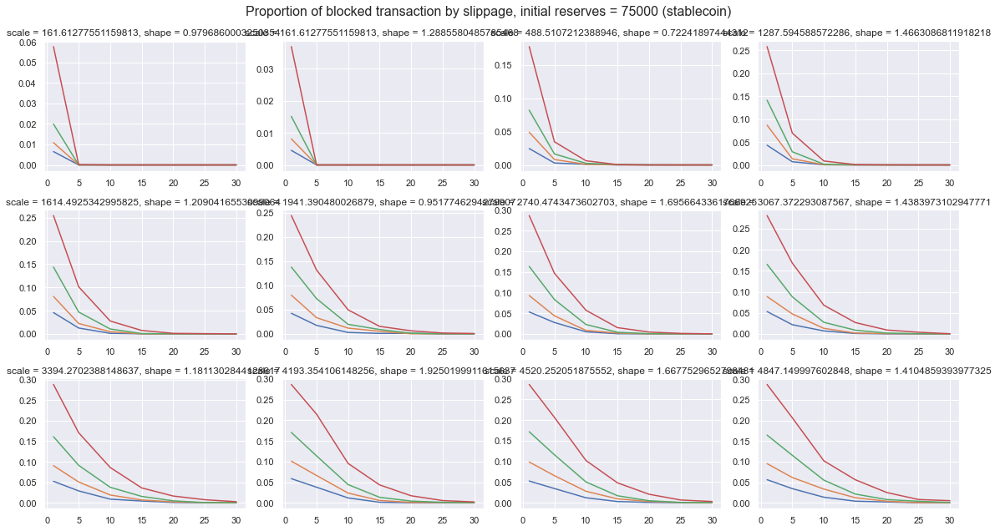

In [100]:
import matplotlib.pyplot as plt



filtered_stats_df.sort_values(by=['freq', 'scale', 'shape'], inplace=True, ascending=[True, True, False])


INITIAL_RESERVE = 75000

    
groups = filtered_stats_df.groupby(['scale', 'shape'])

N = 12
COLS = 4
ROWS = N//COLS + (N%COLS != 0)
fig, ax = plt.subplots(ROWS, COLS, figsize=(COLS*4, ROWS*3))
ax = ax.ravel()

i = 0

for freq, group_df in groups:
    groups2 = group_df.groupby(['freq'])
    for name, group_stats_df in groups2:
        slippage_list = []
        blocks_list = []



        group_stats_df.sort_values('slippage', inplace=True)
        #print(group_stats_df)

        for index, row in group_stats_df.iterrows():      
            blocks = row['blocked_exceeded_slippage']
            total = row['count']

            blocks_list.append(blocks/total)
            slippage_list.append(row['slippage'])


        ax[i].plot(slippage_list, blocks_list)

        fig.suptitle(f'Proportion of blocked transaction by slippage, initial reserves = {INITIAL_RESERVE} (stablecoin)', fontsize=16)
        fig.tight_layout()
        
     #   print(ax, i)
     #   print(ax[i])
        ax[i].set_title(f'scale = {freq[0]}, shape = {freq[1]} ') #todo: iloc may differ from simulatuions df


       # print(name)
    i += 1


## EDA

In [45]:
import matplotlib.pyplot as plt



filtered_stats_df.sort_values(by=['initial_reserve_usd', 'scale', 'shape'], inplace=True, ascending=[True, True, False])
reserve_groups = filtered_stats_df.groupby('initial_reserve_usd')

for name, curr_reserve_stats_df in reserve_groups:
    N = len(curr_reserve_stats_df)
    COLS = 4
    ROWS = N//COLS + (N%COLS != 0)

    fig, ax = plt.subplots(ROWS, COLS, figsize=(COLS*4, ROWS*3))
    axes = ax.ravel()
    axes = axes.reshape(ROWS, COLS).T.ravel()
    
    i = 0
    for index, row in curr_reserve_stats_df.iterrows():
        ax = axes[i]

        scale, shape, initial_reserves_usd, blocks, count = row['scale'], row['shape'], row['initial_reserve_usd'], row['blocked_transactions'], row['count']

        df = simulations[row['sim_index']]

        values = df[df.token_in == 'Y'].token_in_amount.copy()
        ax.hist(values, bins=50)

        ax.set_ylabel('count')
        ax.set_title(f'scale = {scale:.2f}, shape = {shape:.2f}, blocks: {blocks} out of {count}') #todo: iloc may differ from simulatuions df

        i += 1

    fig.suptitle(f'Histogram of generated swap values (for stablecoin), initial reserves = {name}', fontsize=16)
    fig.tight_layout()


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x0000015EE8DEF160> (for post_execute):


KeyboardInterrupt: 

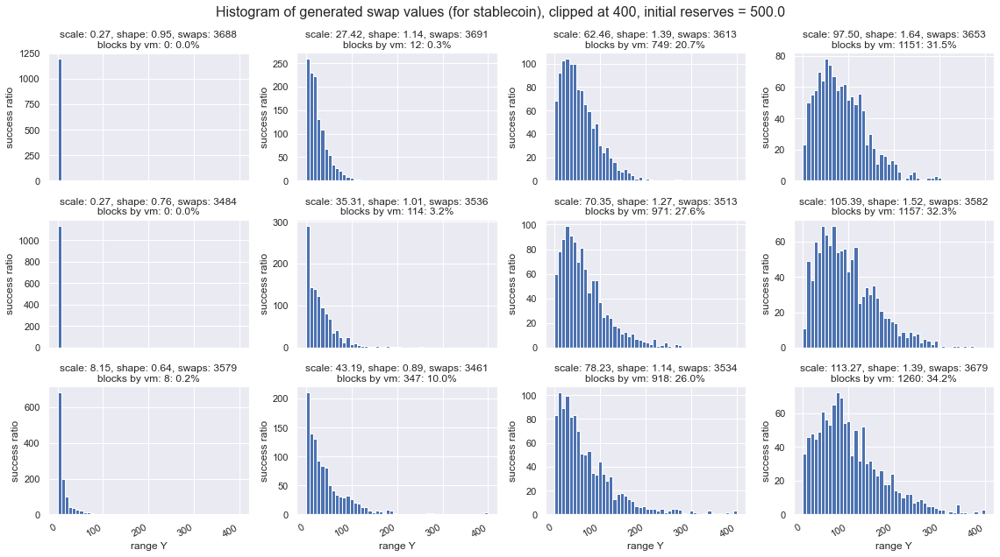

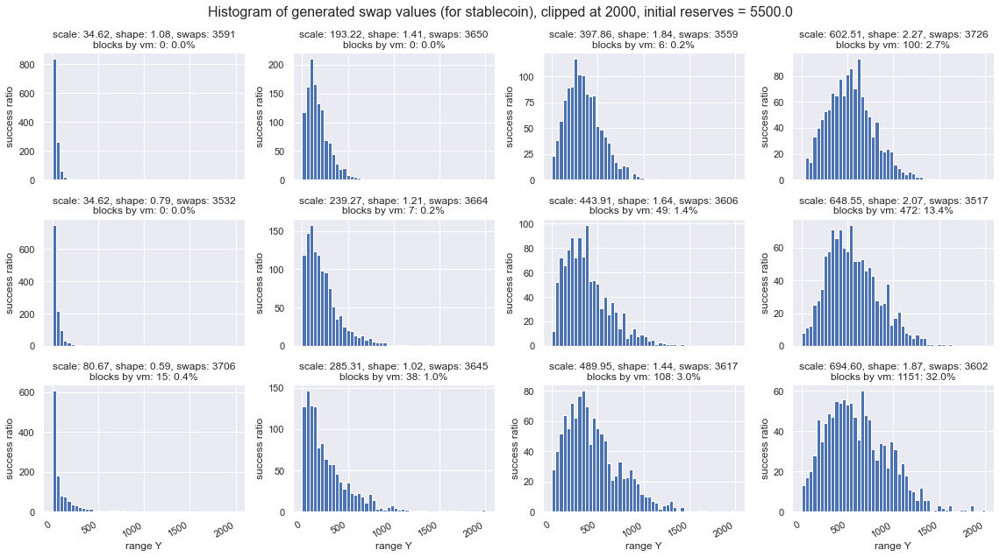

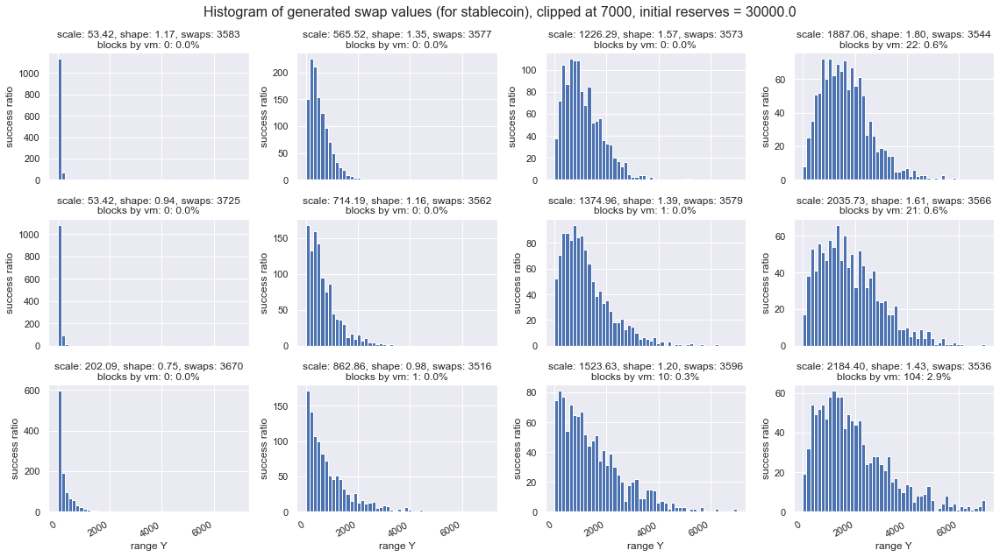

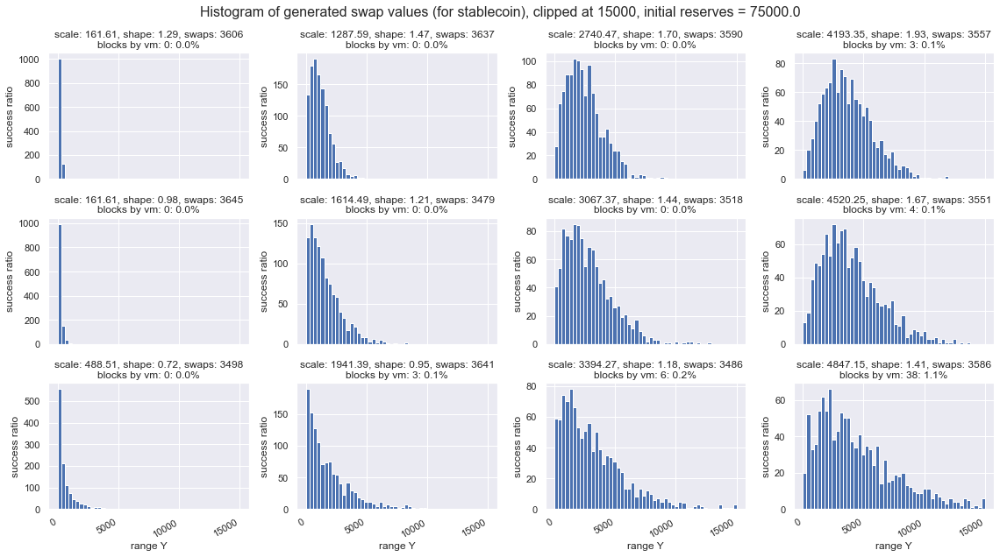

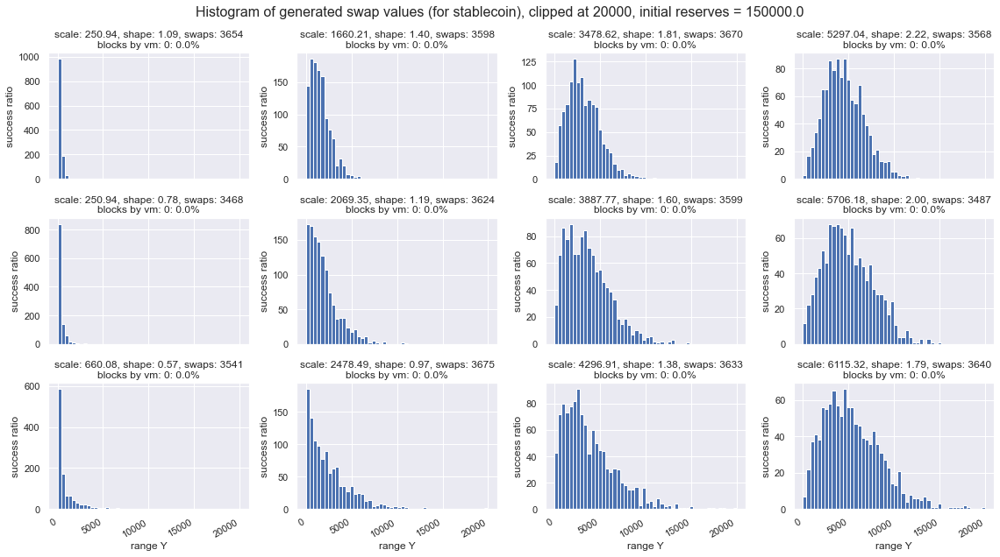

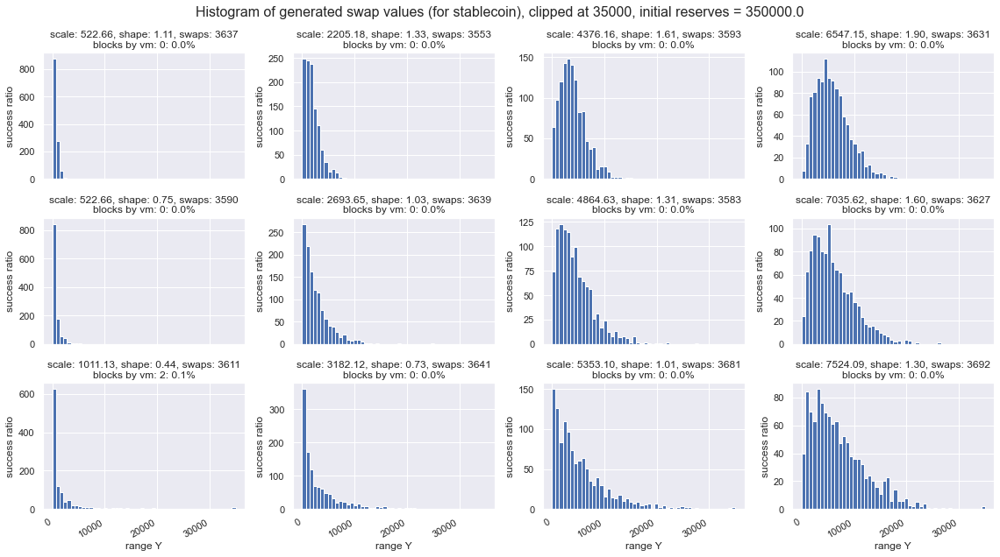

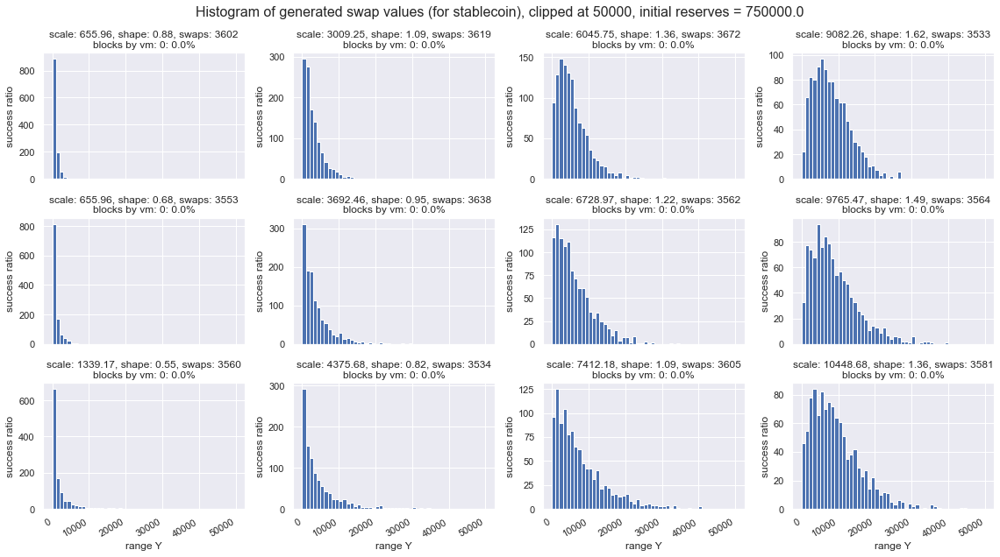

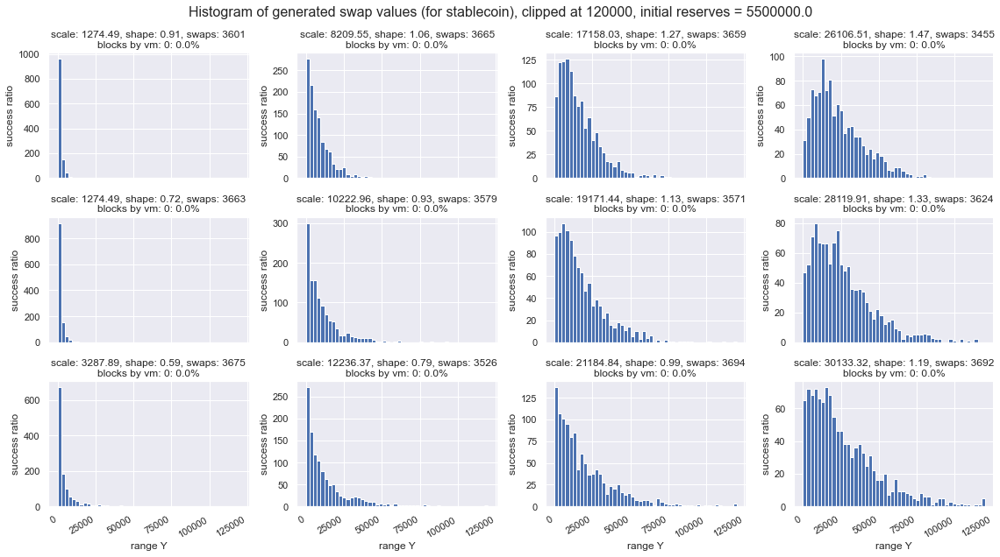

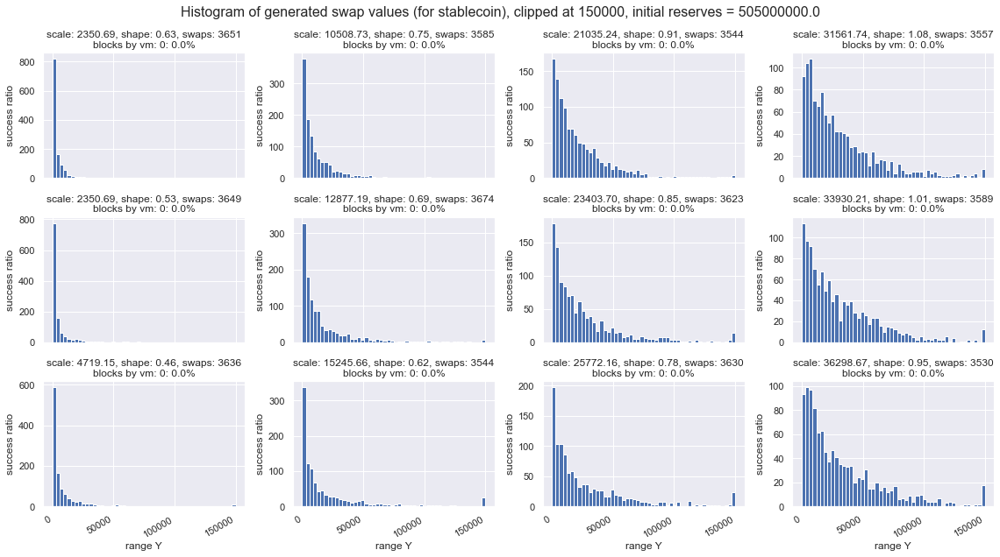

In [81]:
import matplotlib.pyplot as plt

x_upper_limits = [400, 2000, 7000, 15000, 20000, 35000, 50000, 120000, 150000]

filtered_stats_df.sort_values(by=['initial_reserve_usd', 'scale', 'shape'], inplace=True, ascending=[True, True, False])
reserve_groups = filtered_stats_df.groupby('initial_reserve_usd')

j = 0
for name, curr_reserve_stats_df in reserve_groups:
    N = len(curr_reserve_stats_df)
    COLS = 4
    ROWS = N//COLS + (N%COLS != 0)

    fig, ax = plt.subplots(ROWS, COLS, figsize=(COLS*4, ROWS*3))
    axes = ax.ravel()
    axes = axes.reshape(ROWS, COLS).T.ravel()
    
    i = 0
    for index, row in curr_reserve_stats_df.iterrows():
        ax = axes[i]

        scale, shape, initial_reserves_usd, blocks, count = row['scale'], row['shape'], row['initial_reserve_usd'], row['blocked_transactions'], row['count']

        df = simulations[row['sim_index']]

        values = df[df.token_in == 'Y'].token_in_amount.copy()
        upper_limit = x_upper_limits[j]
        values[values > upper_limit] = upper_limit
        ax.hist(values, bins=50, range=(0, upper_limit))

        ax.set_xlabel('range Y')
        ax.set_ylabel('success ratio')
        show_title(ax, row)

        i += 1

    fig.suptitle(f'Histogram of generated swap values (for stablecoin), clipped at {upper_limit}, initial reserves = {name}', fontsize=16)
    fig.tight_layout()
    
    j += 1


In [82]:
import math

def get_success_ratio_df(swaps1_df, x_upper_limit, bins=10):
    bandwidth = x_upper_limit // bins
    MAX = x_upper_limit
    #swaps1_df[swaps1_df.token_in == 'Y'].token_in_amount.max() # HARDCODED Y_NAME
    success_ratio_df = pd.DataFrame(columns=['lower', 'upper', 'ratio', 'occur'])

    for index, i in enumerate(range(0, math.ceil(MAX - bandwidth + 1), int(bandwidth))):
        a, b = i, i + bandwidth

        range_swaps_y_df = swaps1_df[(swaps1_df.token_in == 'Y') & (swaps1_df.token_in_amount >= a) &
                                      (swaps1_df.token_in_amount <= b)]

        success_cnt = range_swaps_y_df[range_swaps_y_df.status == 'SUCCESS'].shape[0]
        blocked_vm_cnt = range_swaps_y_df[range_swaps_y_df.status == 'BLOCKED_BY_VOLATILITY_MITIGATION'].shape[0]
        total_cnt = range_swaps_y_df.shape[0]
        
        if total_cnt != 0:#???
            success_ratio = success_cnt / total_cnt

            success_ratio_df.loc[index] = [a, b, success_ratio, total_cnt]
    
    return success_ratio_df

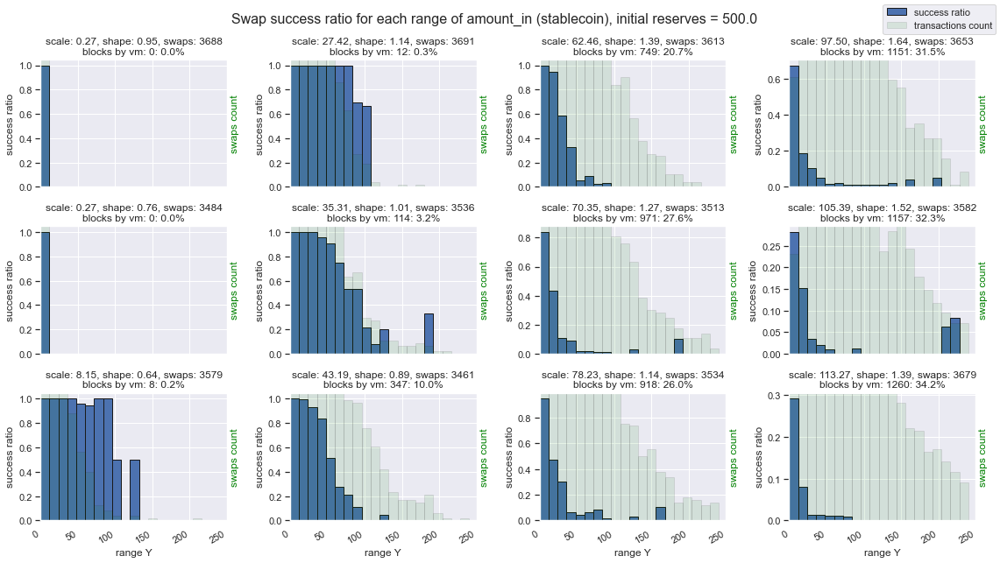

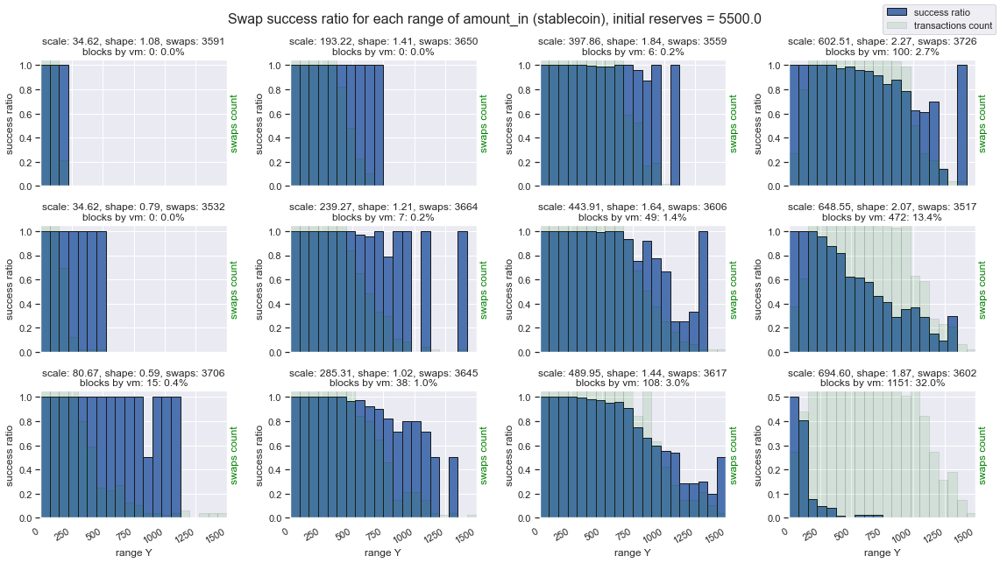

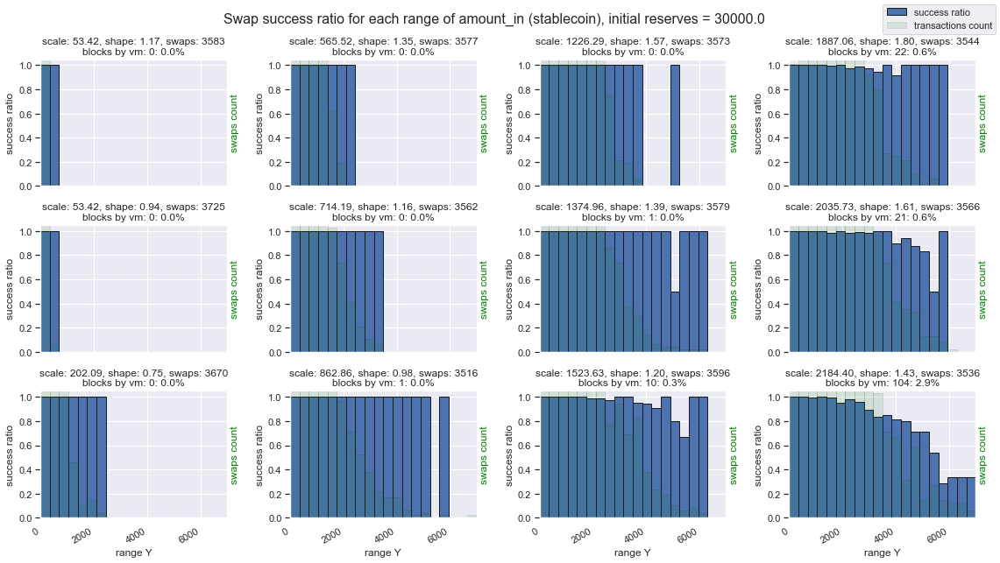

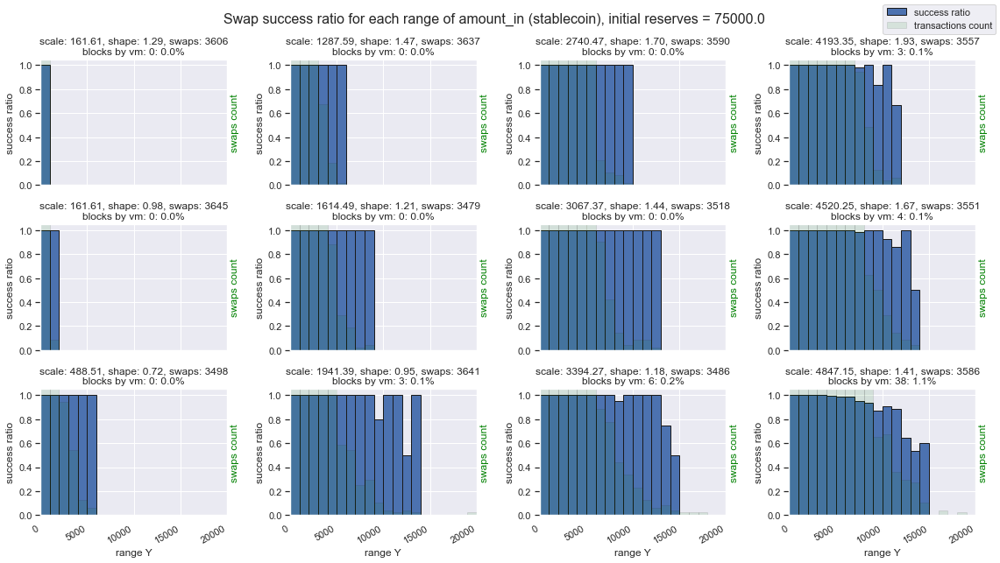

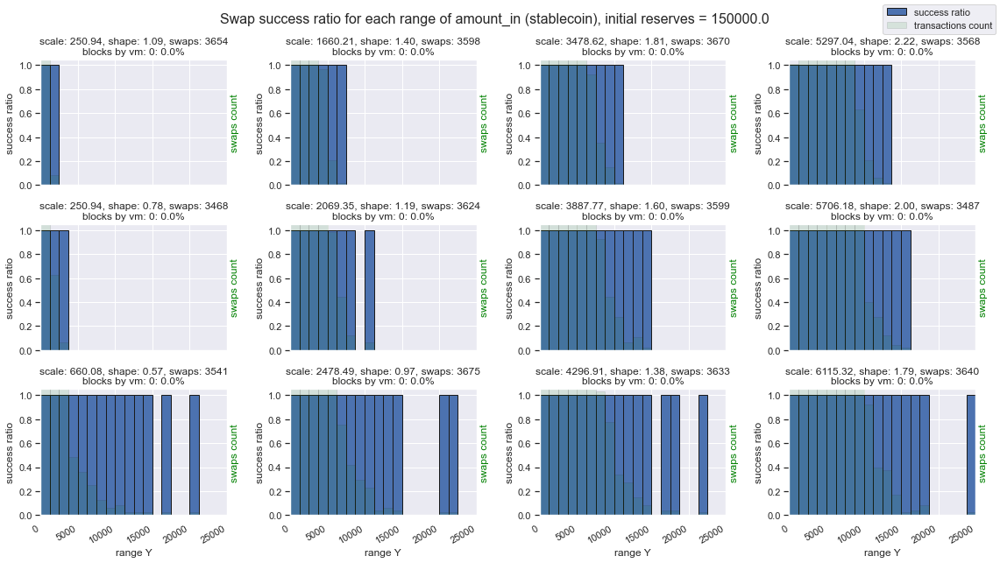

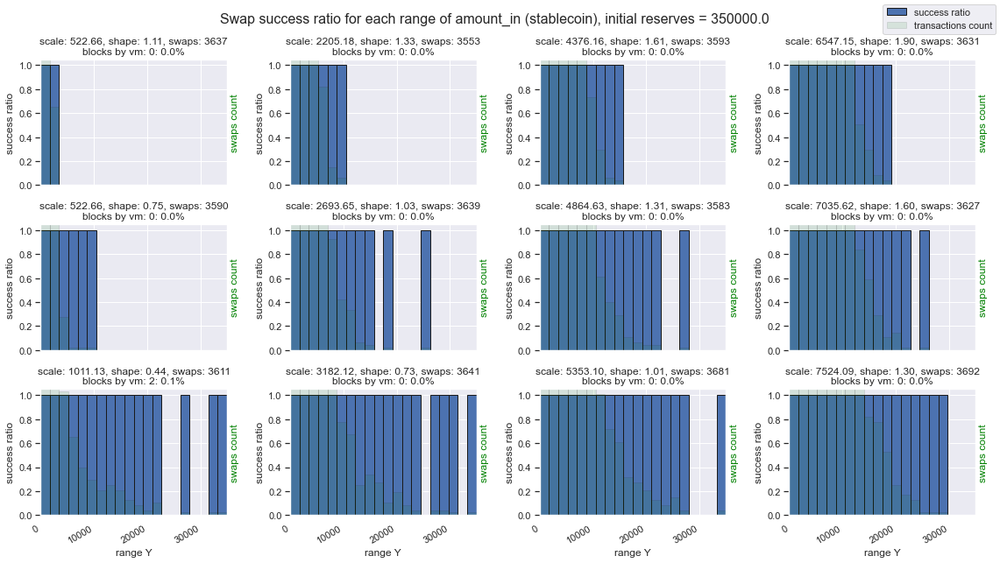

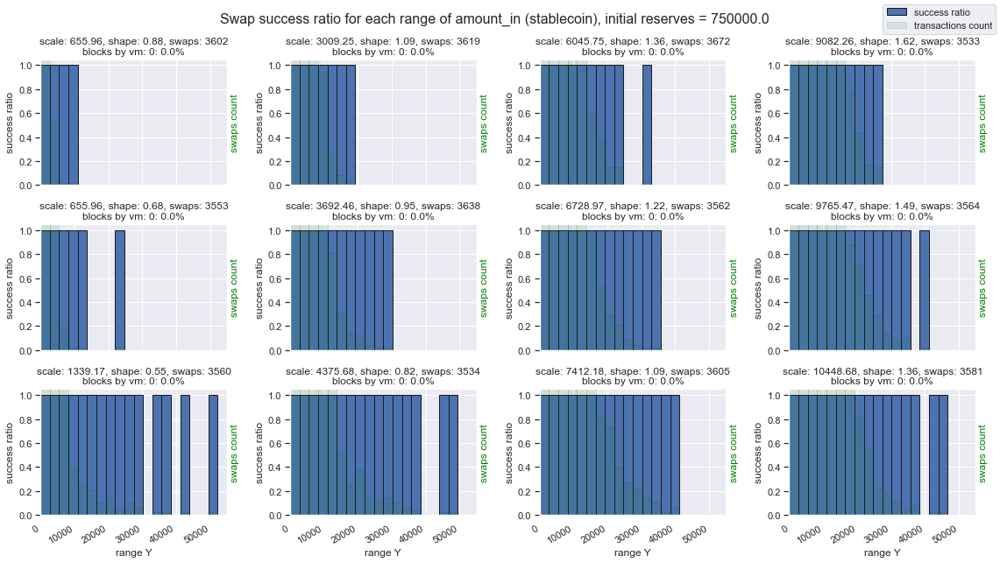

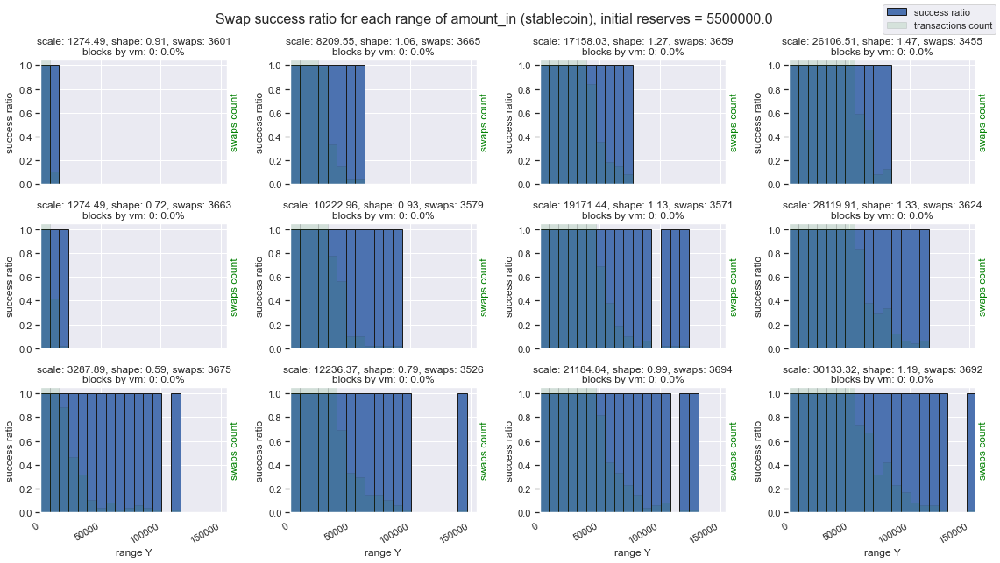

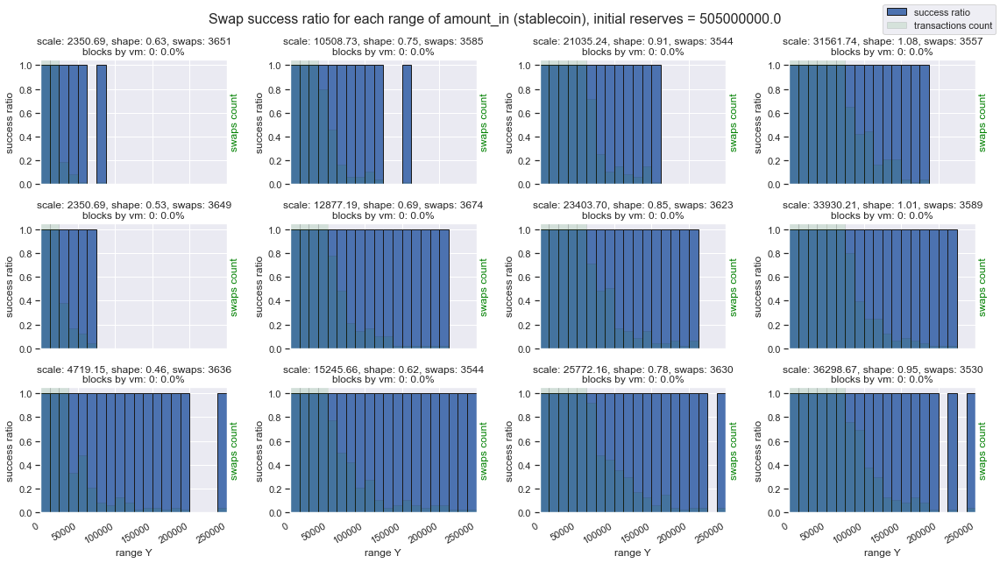

In [83]:
filtered_stats_df.sort_values(by=['initial_reserve_usd', 'scale', 'shape'], inplace=True, ascending=[True, True, False])
reserve_groups = filtered_stats_df.groupby('initial_reserve_usd')


x_upper_limits = [250, 1500, 7000, 20000, 25000, 35000, 55000, 155000, 250000]
j = 0

for name, curr_reserve_stats_df in reserve_groups:
    N = len(curr_reserve_stats_df)
    COLS = 4
    ROWS = N//COLS + (N%COLS != 0)

    fig, ax = plt.subplots(ROWS, COLS, figsize=(COLS*4, ROWS*3))
    axes = ax.ravel()
    axes = axes.reshape(ROWS, COLS).T.ravel()

    i = 0
    for index, row in curr_reserve_stats_df.iterrows():
        ax = axes[i]

        scale, shape, initial_reserves_usd, blocks, count = row['scale'], row['shape'], row['initial_reserve_usd'], row['blocked_transactions'], row['count']

        df = simulations[row['sim_index']]

        success_ratio_df = get_success_ratio_df(df, x_upper_limits[j], 20)
        #print(success_ratio_df)


        ax2 = ax.twinx()
        ax2.bar(success_ratio_df.lower, success_ratio_df.occur, width=success_ratio_df.upper-success_ratio_df.lower, ec="k", align="edge", label='transactions count', color='green', alpha=0.1)
        ax2.set_ylim(0, 50)
        ax2.tick_params(axis='y', colors='green')
        ax2.set_ylabel('swaps count', color='green')
        ax2.set_yticks([])
        #ax.tick_params(axis='y', colors='blue')

        ax.set_xlabel('range Y')
        ax.set_ylabel('success ratio')

        ax.set_xlim(0, x_upper_limits[j])
        ax.bar(success_ratio_df.lower, success_ratio_df.ratio, width=success_ratio_df.upper-success_ratio_df.lower, ec="k", align="edge", label='success ratio')
        show_title(ax, row, i==0)
        
        i += 1

    
    fig.suptitle(f'Swap success ratio for each range of amount_in (stablecoin), initial reserves = {name}', fontsize=16)
    fig.tight_layout()
    
    j += 1


In [84]:
def slice_factor_curve(ax, swaps1_df):
    sns.scatterplot(data=swaps1_df[swaps1_df.mitigator_check_status == 'CHECKED'], x='slice_factor', y='out_amount_diff', hue='status', hue_order=['SUCCESS', 'BLOCKED_BY_VOLATILITY_MITIGATION',], ax=ax)

    slice_factor = np.arange(0, 100)
    slice_factor_curve = slice_factor * np.sqrt(slice_factor).astype(int)
    slice_factor_curve[slice_factor_curve > 98] = 98
    out_amount_diff = (100 - slice_factor_curve)
    g = sns.lineplot(x=slice_factor, y=out_amount_diff, color='red', label='out_amount_diff_limit', ax=ax)
    g.legend_.remove()


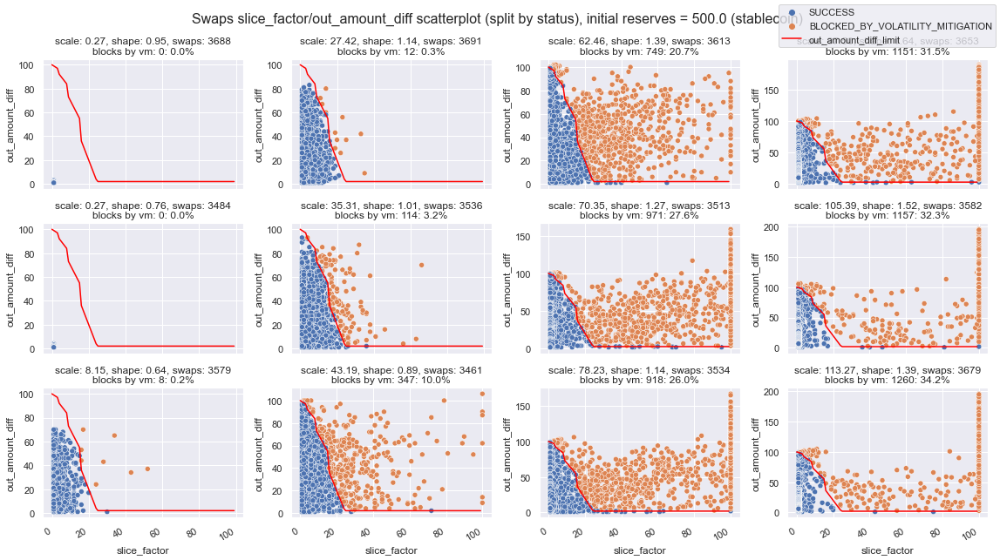

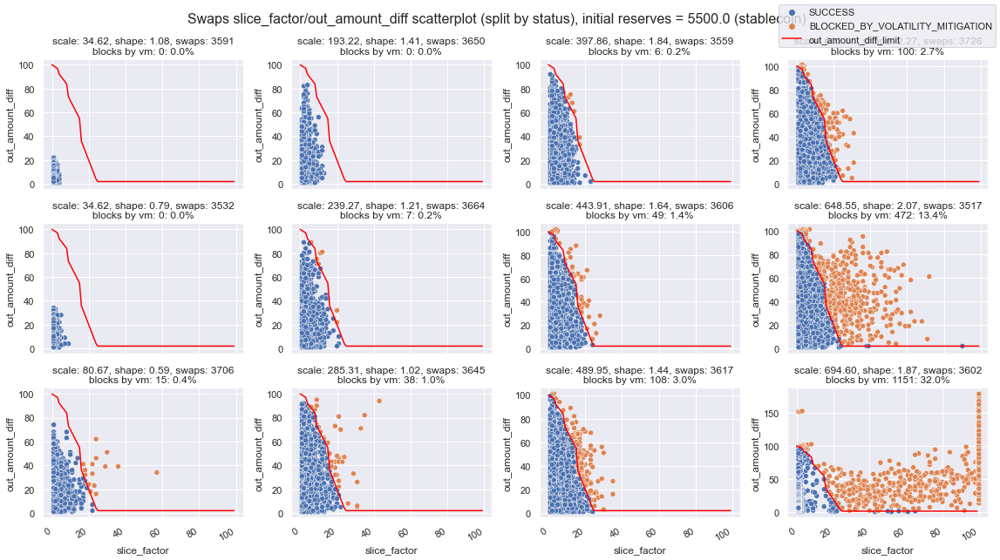

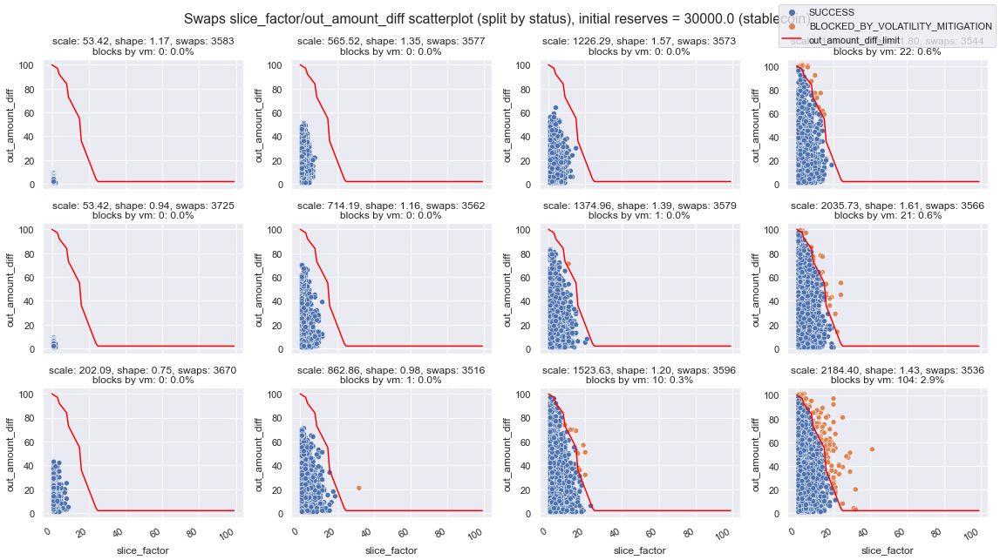

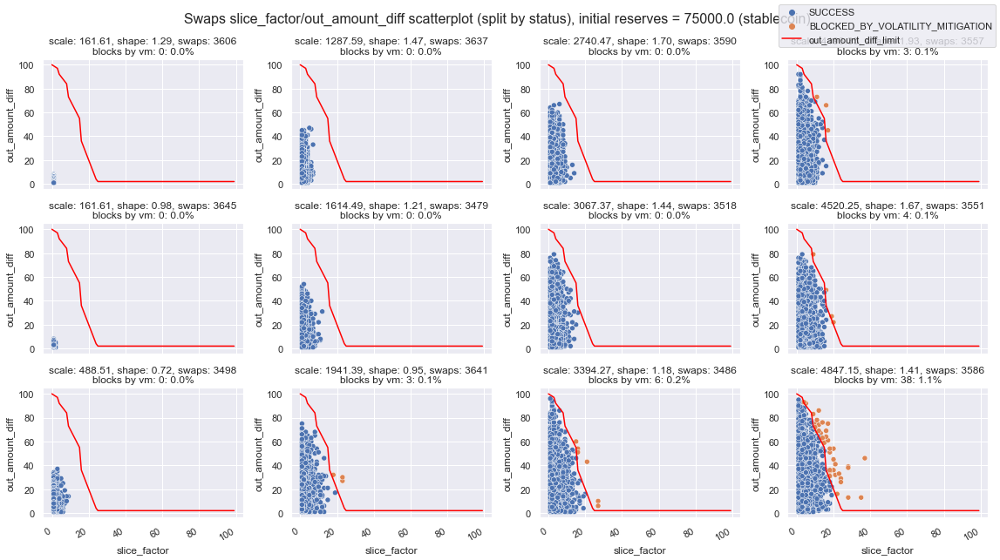

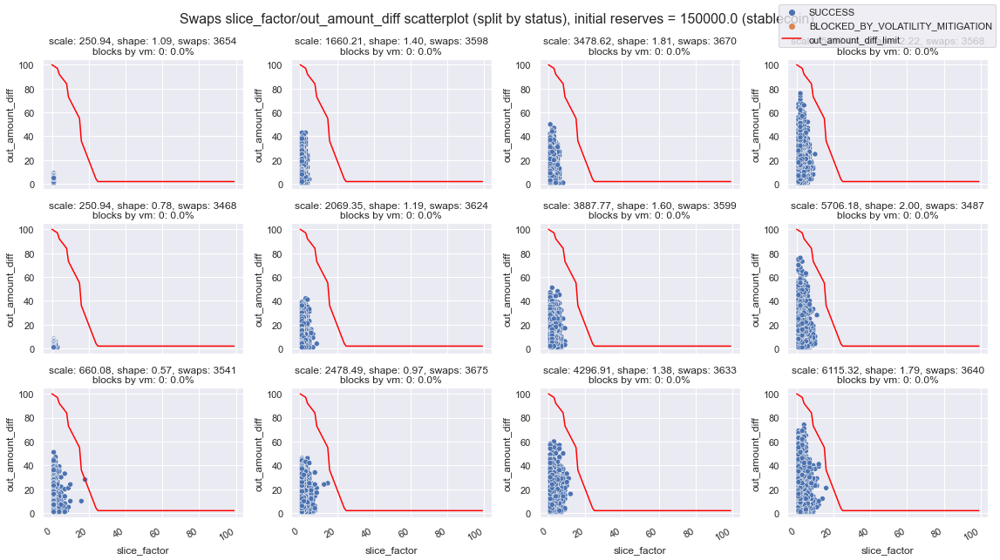

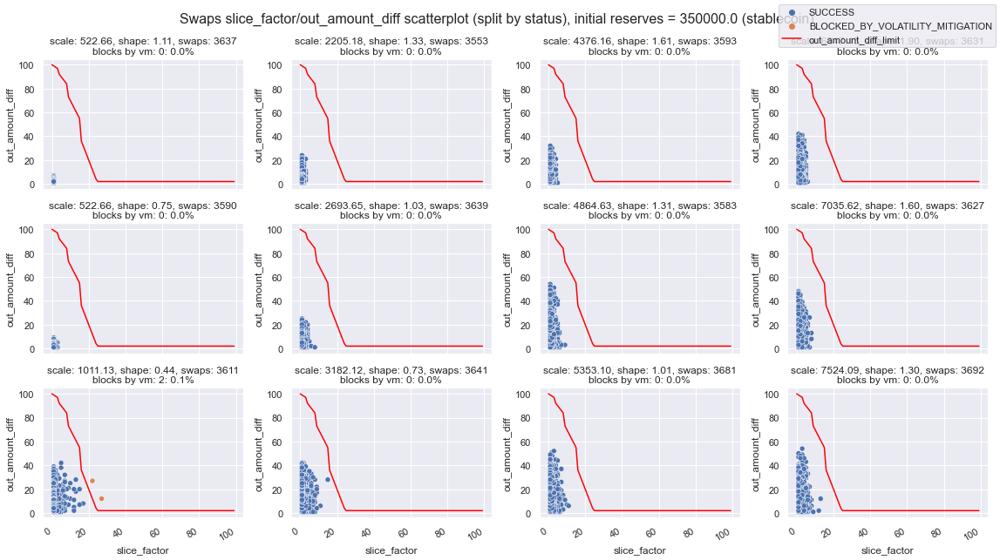

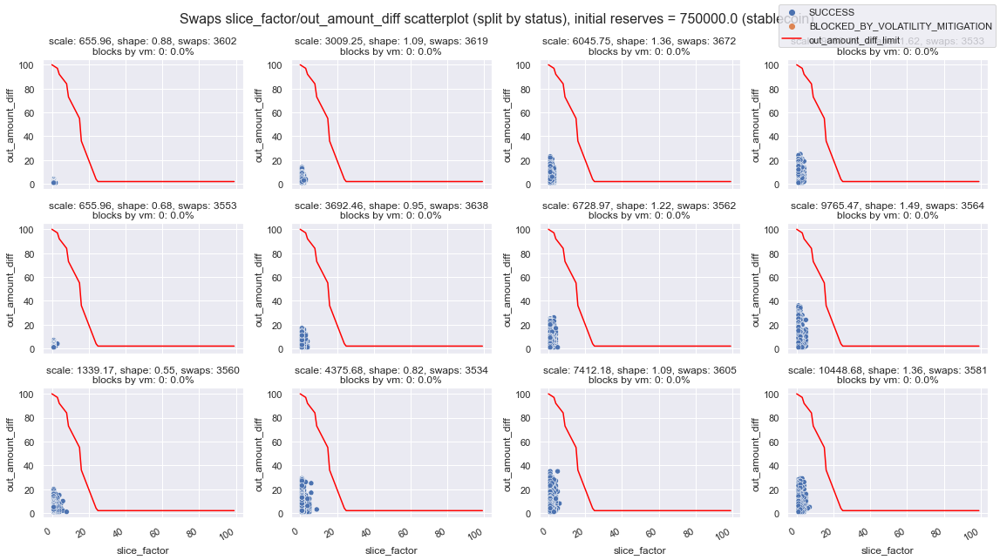

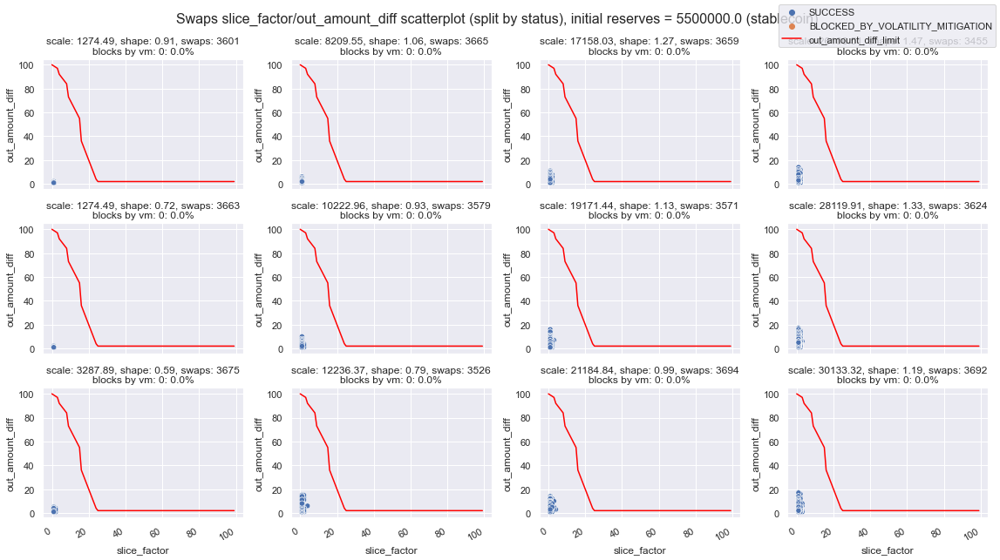

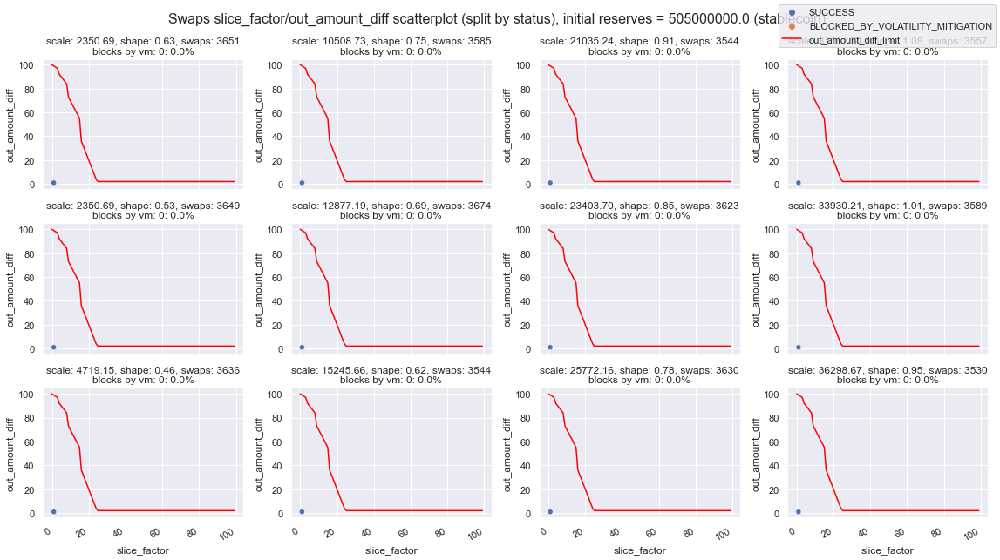

In [85]:
import matplotlib.pyplot as plt

filtered_stats_df.sort_values(by=['initial_reserve_usd', 'scale', 'shape'], inplace=True, ascending=[True, True, False])
reserve_groups = filtered_stats_df.groupby('initial_reserve_usd')
j = 0

for name, curr_reserve_stats_df in reserve_groups:
    N = len(curr_reserve_stats_df)
    COLS = 4
    ROWS = N//COLS + (N%COLS != 0)

    fig, ax = plt.subplots(ROWS, COLS, figsize=(COLS*4, ROWS*3))
    axes = ax.ravel()
    axes = axes.reshape(ROWS, COLS).T.ravel()

    i = 0
    for index, row in curr_reserve_stats_df.iterrows():
        ax = axes[i]
        scale, shape, initial_reserves_usd = row['scale'], row['shape'], row['initial_reserve_usd']
        blocks, blocks_vm, blocks_slippage, count = row['blocked_transactions'], row['blocked_by_volatility_mitigator'], row['blocked_exceeded_slippage'], row['count']
    
        df = simulations[row['sim_index']]
        slice_factor_curve(ax, df)
        show_title(ax, row, i==0)

        i += 1



    fig.suptitle(f'Swaps slice_factor/out_amount_diff scatterplot (split by status), initial reserves = {name} (stablecoin)', fontsize=16)
    fig.tight_layout()


In [86]:
def plot_price_variation(ax, swaps0_df, swaps1_df):
    ax.plot_date(x=swaps0_df['transaction_timestamp'], y=swaps0_df['X_price'], linestyle='solid', marker=None, label='Mitigator off', color='red')
    ax.plot_date(x=swaps1_df['transaction_timestamp'], y=swaps1_df['X_price'], linestyle='solid', marker=None, label='Mitigator on',)

    ax.set_xlabel('Swap timestamp')
    ax.set_ylabel(Y_NAME)

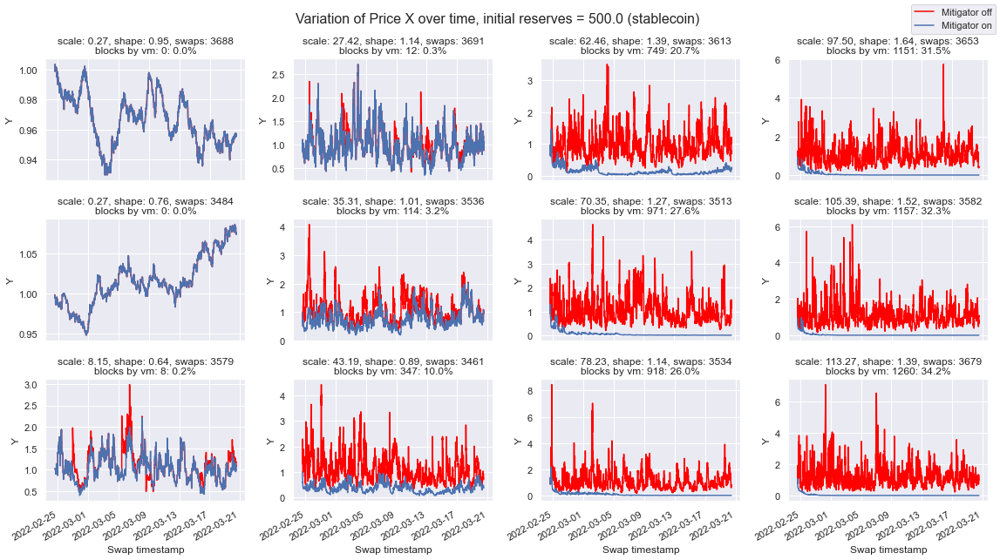

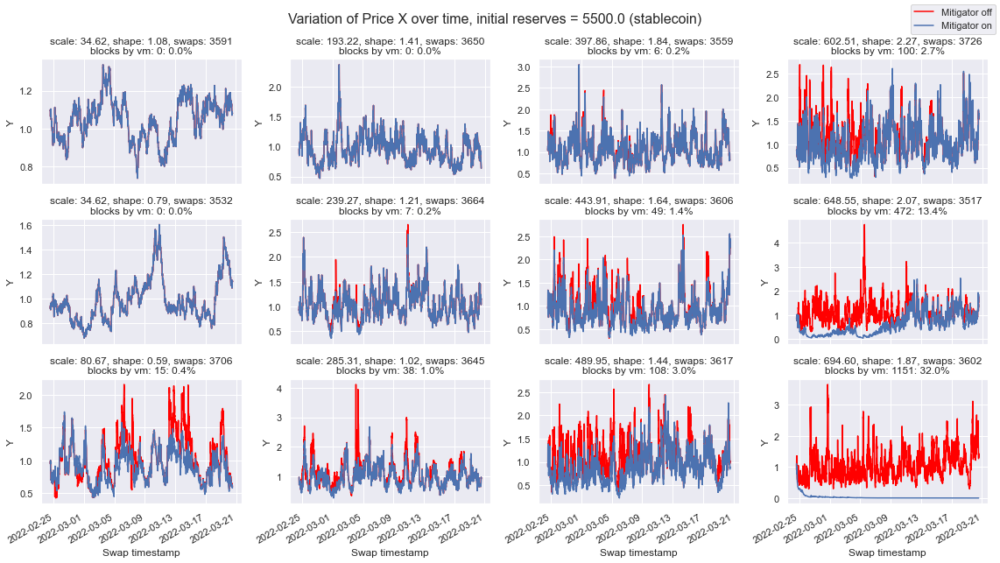

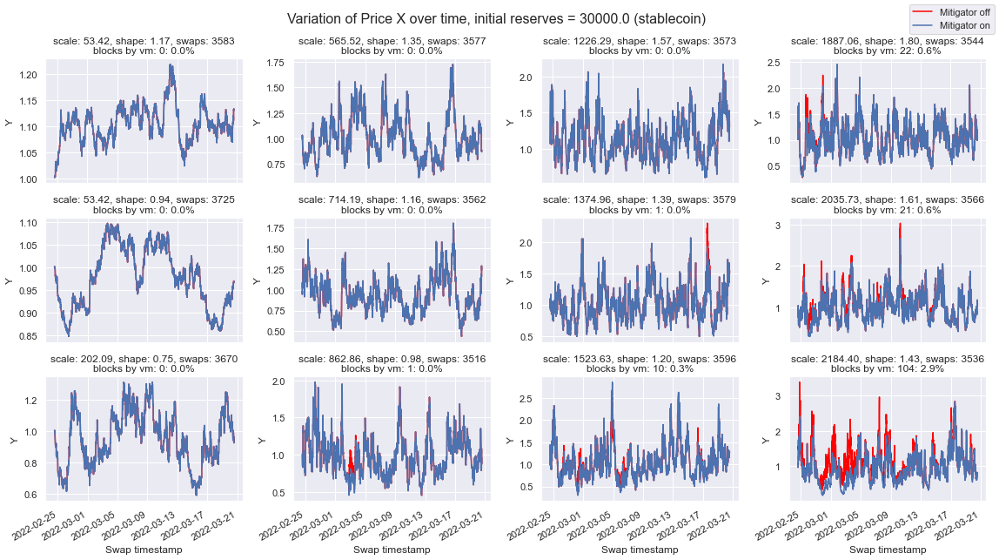

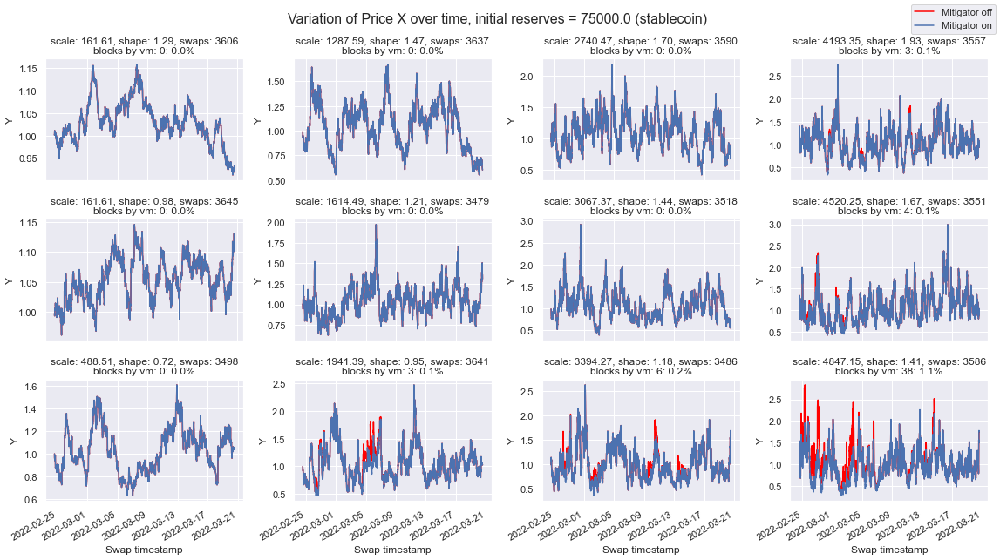

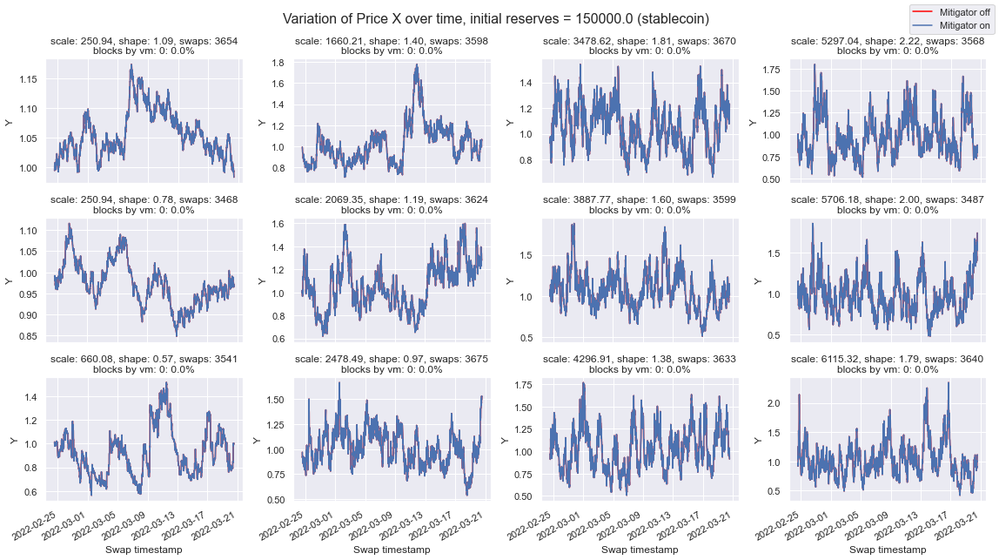

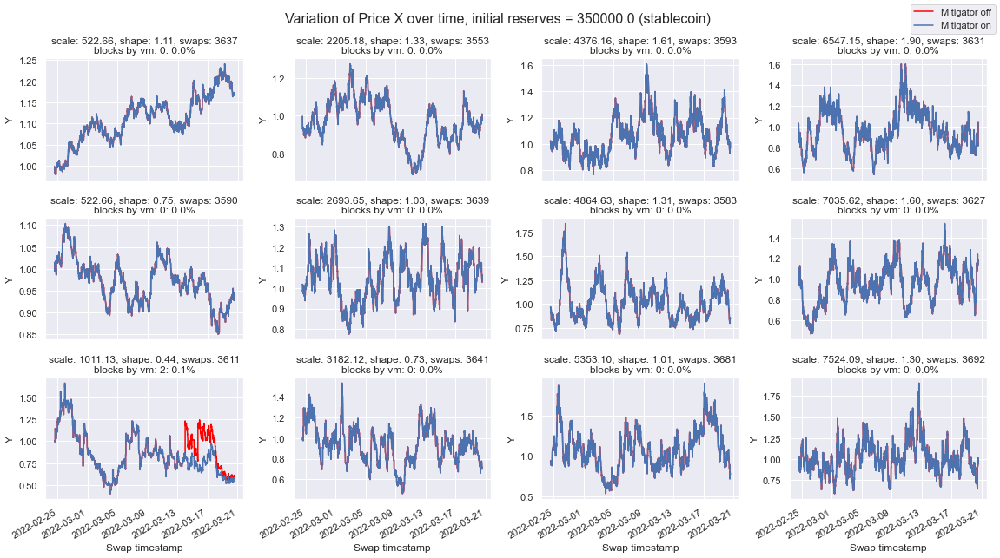

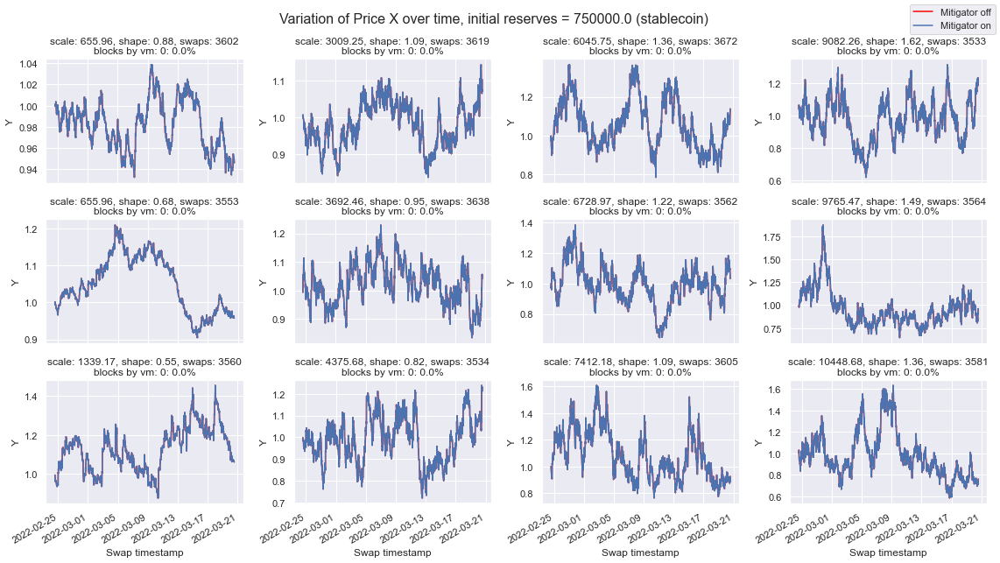

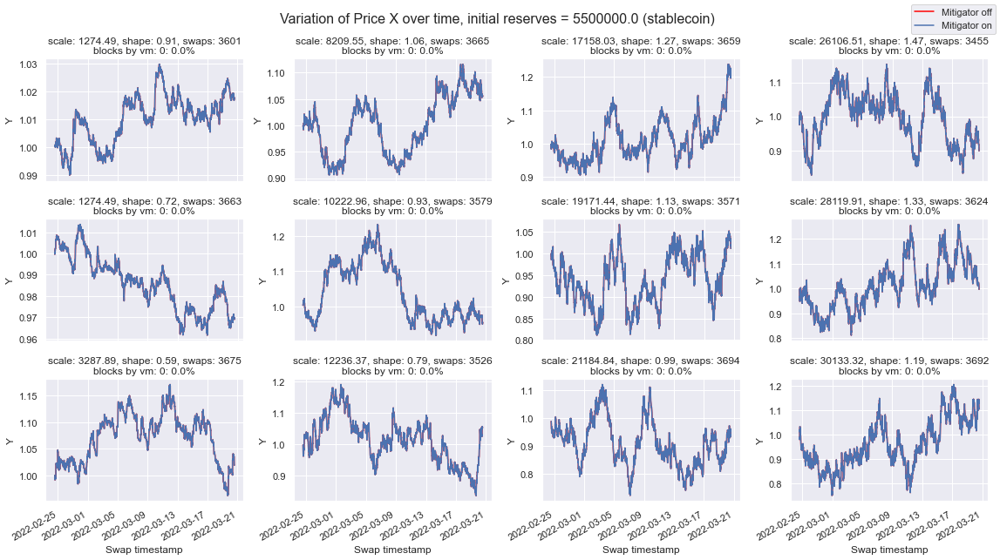

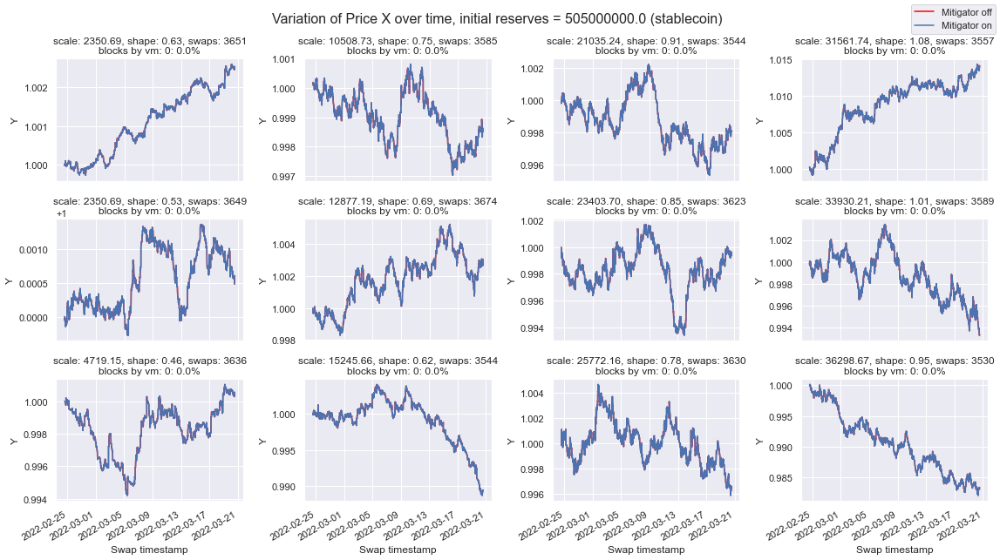

In [87]:
import matplotlib.pyplot as plt
import warnings


filtered_stats_df.sort_values(by=['initial_reserve_usd', 'scale', 'shape'], inplace=True, ascending=[True, True, False])
reserve_groups = filtered_stats_df.groupby('initial_reserve_usd')

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for name, curr_reserve_stats_df in reserve_groups:
        N = len(curr_reserve_stats_df)
        COLS = 4
        ROWS = N//COLS + (N%COLS != 0)

        fig, ax = plt.subplots(ROWS, COLS, figsize=(COLS*4, ROWS*3))
        axes = ax.ravel()
        axes = axes.reshape(ROWS, COLS).T.ravel()

        i = 0
        for index, row in curr_reserve_stats_df.iterrows():
            ax = axes[i]
            
            scale, shape, initial_reserves_usd = row['scale'], row['shape'], row['initial_reserve_usd']
            blocks, blocks_vm, blocks_slippage, count = row['blocked_transactions'], row['blocked_by_volatility_mitigator'], row['blocked_exceeded_slippage'], row['count']

            df0, df1 = simulations[row['sim_index'] - 1], simulations[row['sim_index']]
            plot_price_variation(ax, df0, df1)
            show_title(ax, row, i==0)
            #ax.set_xlim(simulations[row['sim_index'] - 1].transaction_timestamp.min(), simulations[row['sim_index'] - 1].transaction_timestamp.min() + datetime.timedelta(hours=1))
            #ax.set_ylim(0, 0.001)
        
            i += 1

        fig.suptitle(f'Variation of Price {X_NAME} over time, initial reserves = {name} (stablecoin)', fontsize=16)
        fig.tight_layout()


In [88]:
def plot_price_impact(ax, swaps0_df, swaps1_df):
    ax.plot_date(data=swaps0_df, x='transaction_timestamp', y='price_diff', linestyle='solid', color='red', marker=None, label='Volatility mitigator off')
    ax.plot_date(data=swaps1_df, x='transaction_timestamp', y='price_diff', linestyle='solid', marker=None, label='Volatility mitigator on')

    ax.set_xlabel('Swap timestamp')
    ax.set_ylim(-1, 1)
    ax.set_ylabel(Y_NAME)

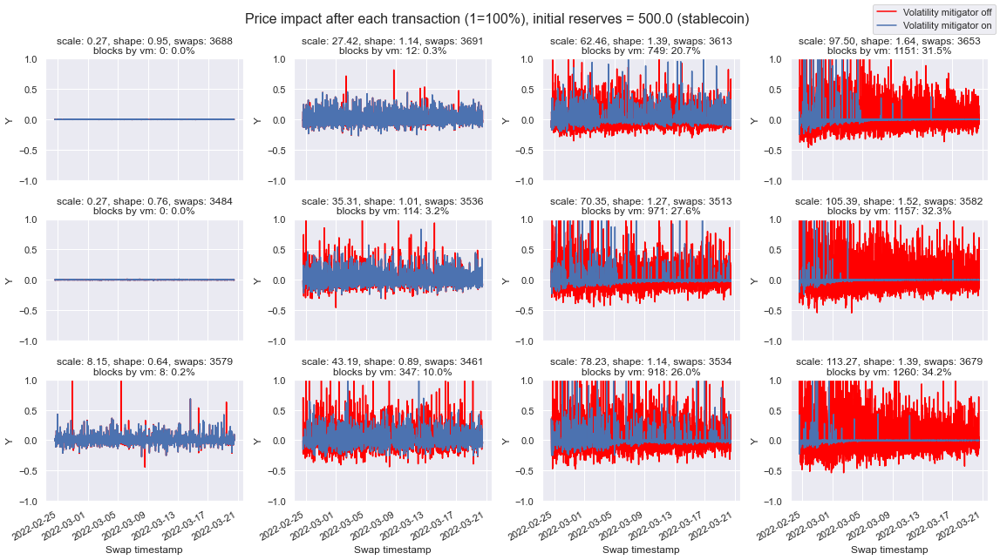

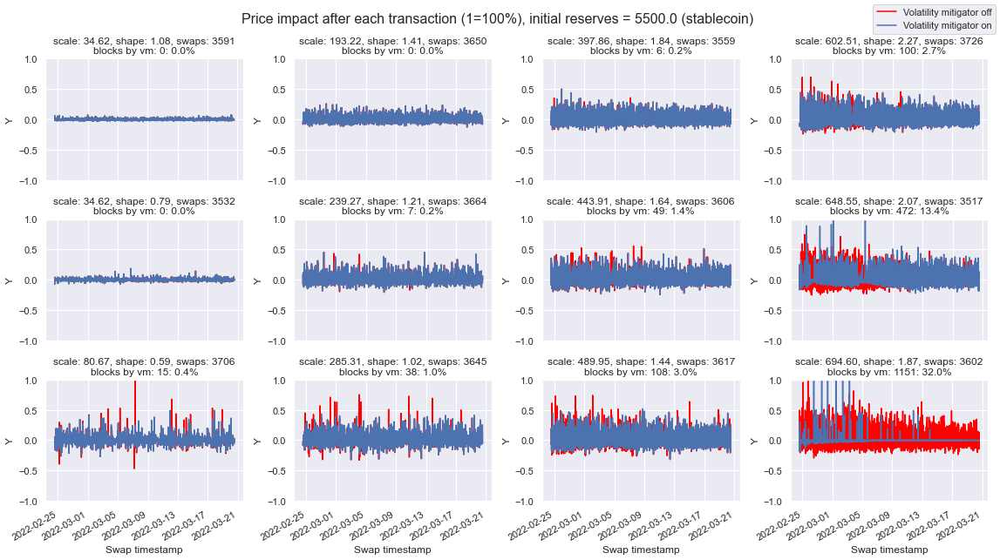

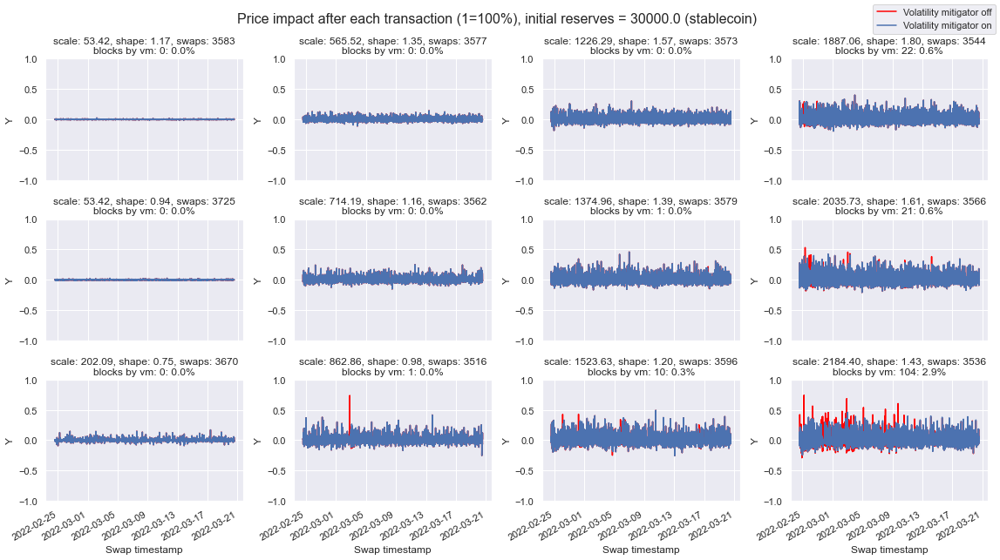

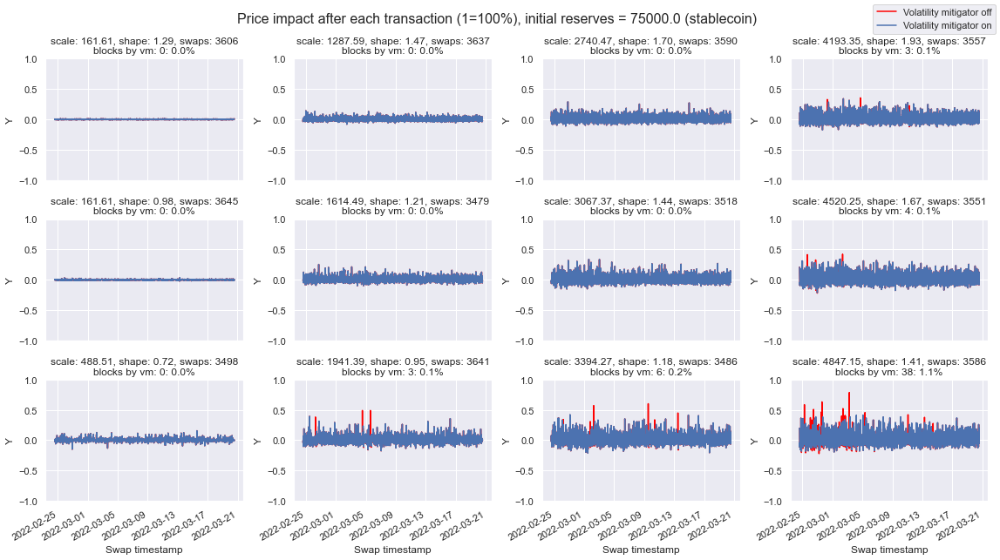

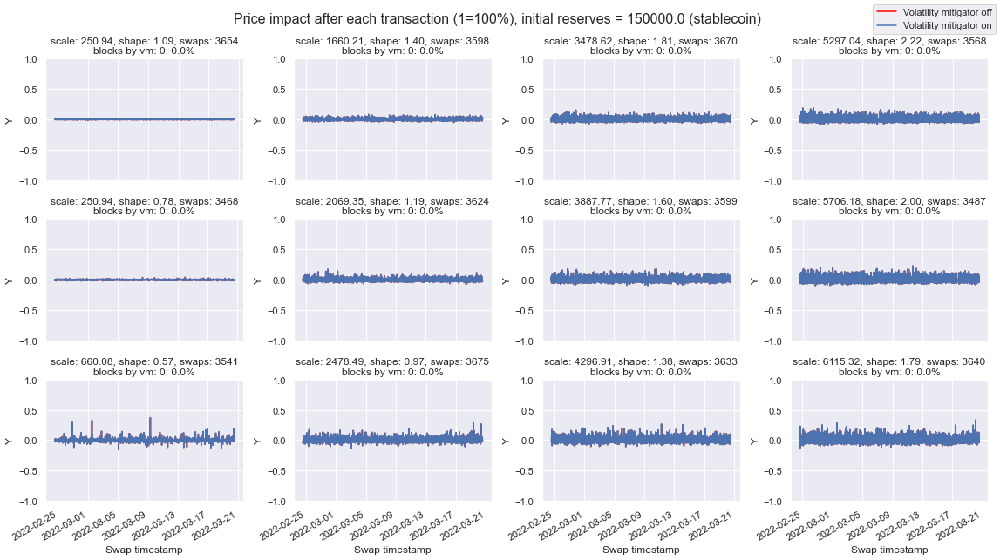

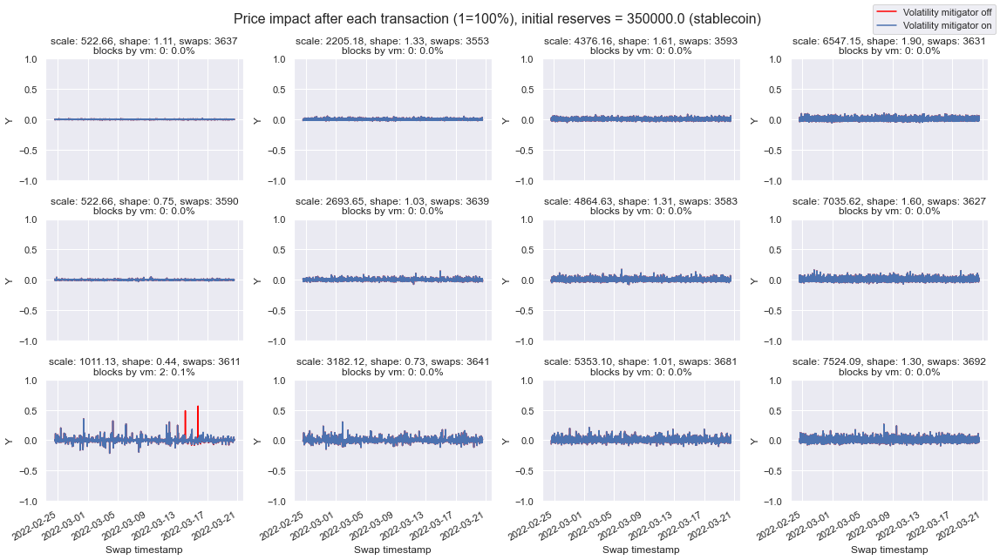

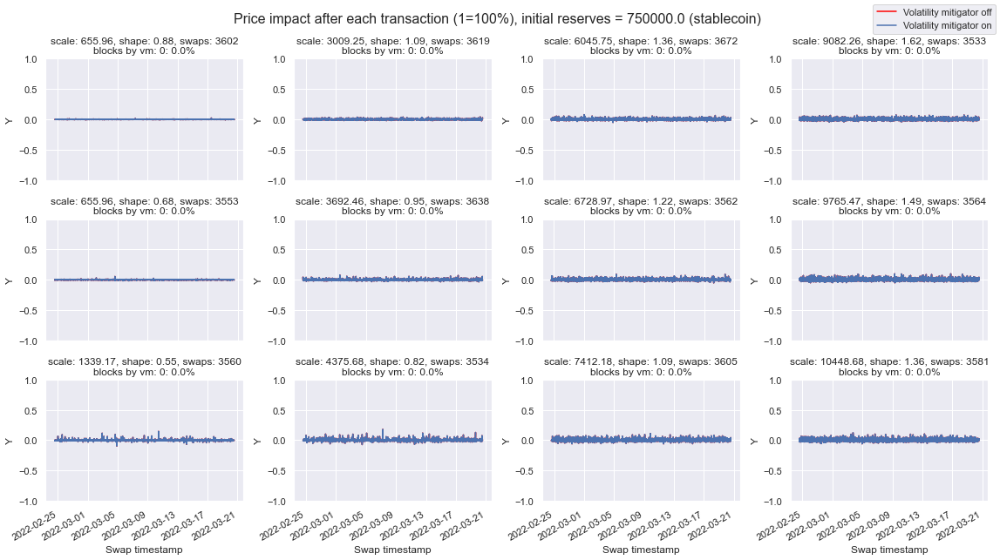

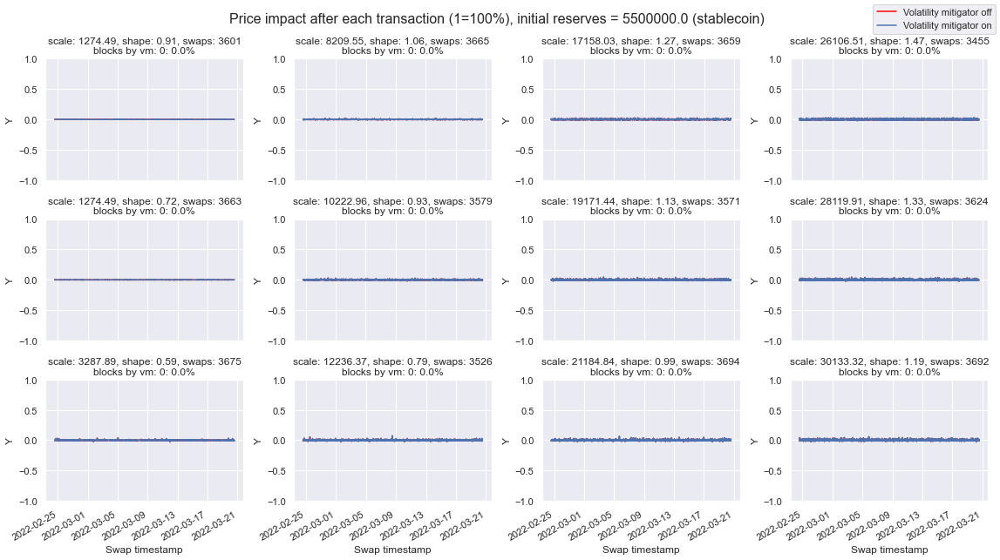

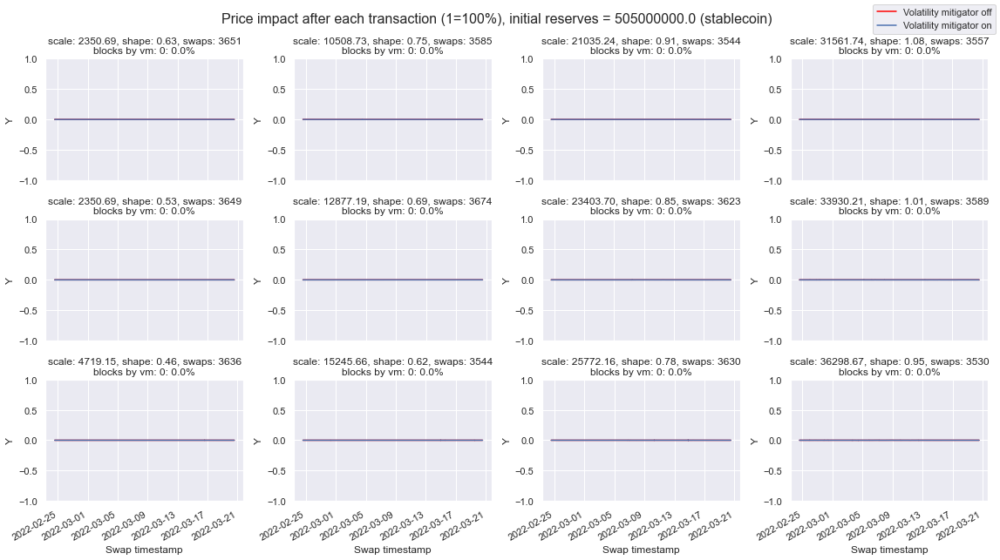

In [89]:
filtered_stats_df.sort_values(by=['initial_reserve_usd', 'scale', 'shape'], inplace=True, ascending=[True, True, False])
reserve_groups = filtered_stats_df.groupby('initial_reserve_usd')

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for name, curr_reserve_stats_df in reserve_groups:
        N = len(curr_reserve_stats_df)
        COLS = 4
        ROWS = N//COLS + (N%COLS != 0)

        fig, ax = plt.subplots(ROWS, COLS, figsize=(COLS*4, ROWS*3))
        axes = ax.ravel()
        axes = axes.reshape(ROWS, COLS).T.ravel()

        i = 0
        for index, row in curr_reserve_stats_df.iterrows():
            ax = axes[i]
            
            scale, shape, initial_reserves_usd, blocks, count = row['scale'], row['shape'], row['initial_reserve_usd'], row['blocked_transactions'], row['count']

            df0, df1 = simulations[row['sim_index'] - 1], simulations[row['sim_index']]
            plot_price_impact(ax, df0, df1)
            show_title(ax, row, i==0)

            i += 1

        fig.suptitle(f'Price impact after each transaction (1=100%), initial reserves = {name} (stablecoin)', fontsize=16)
        fig.tight_layout()


In [90]:
def plot_reserves(ax, swaps0_df, swaps1_df):
    ax.plot(swaps1_df.transaction_timestamp, swaps1_df.reserve_X, label='reserve X mitigator enabled')

    ax.plot(swaps0_df.transaction_timestamp, swaps0_df.reserve_Y, color='red', label='reserve Y (stablecoin) mitigator off')
    ax.plot(swaps1_df.transaction_timestamp, swaps1_df.reserve_Y, color='orange', label='reserve Y (stablecoin) mitigator enabled')

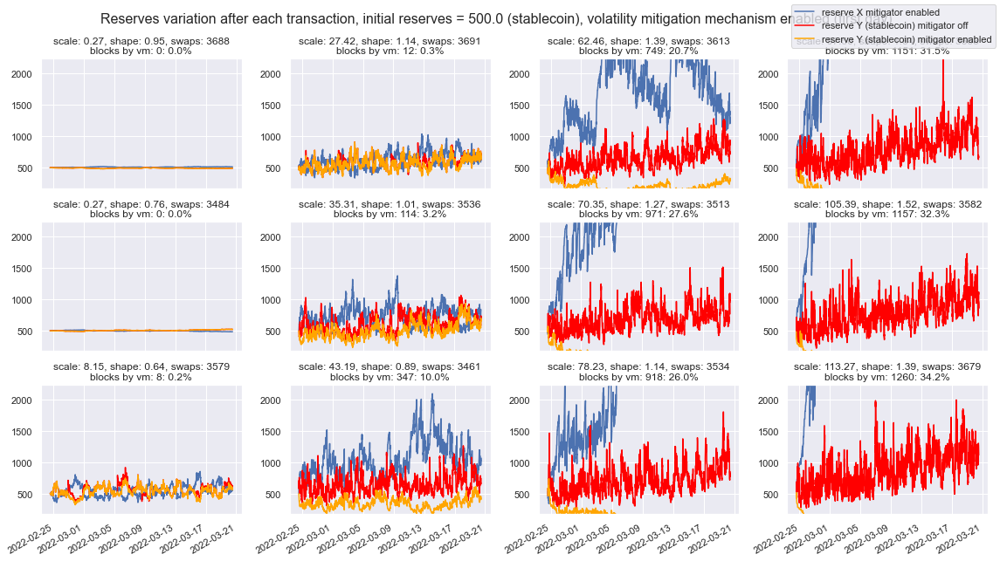

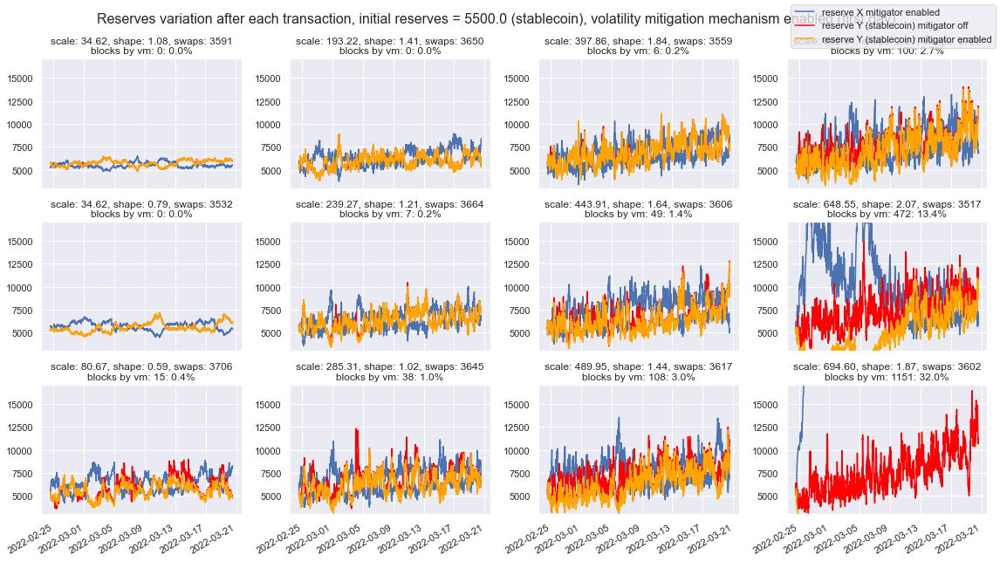

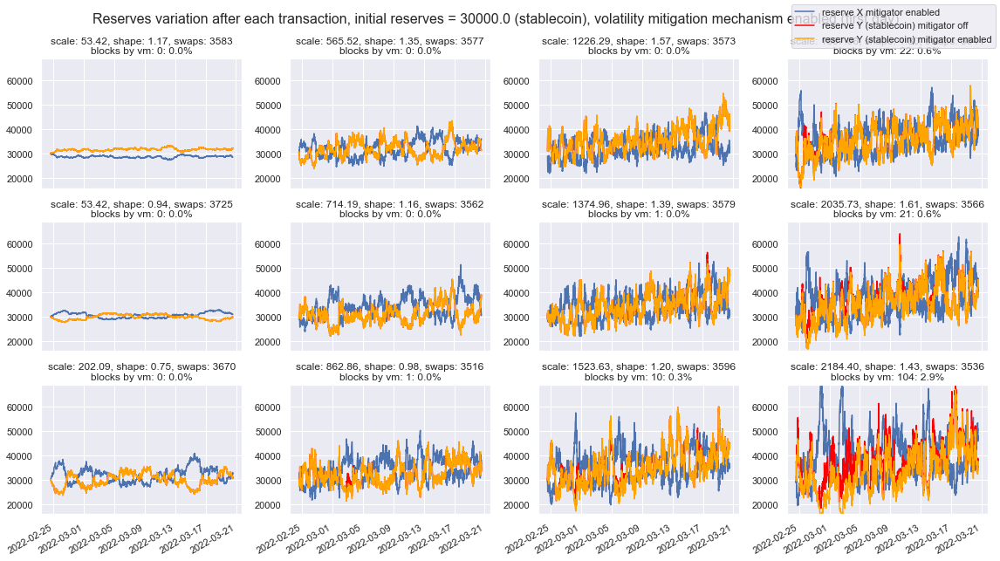

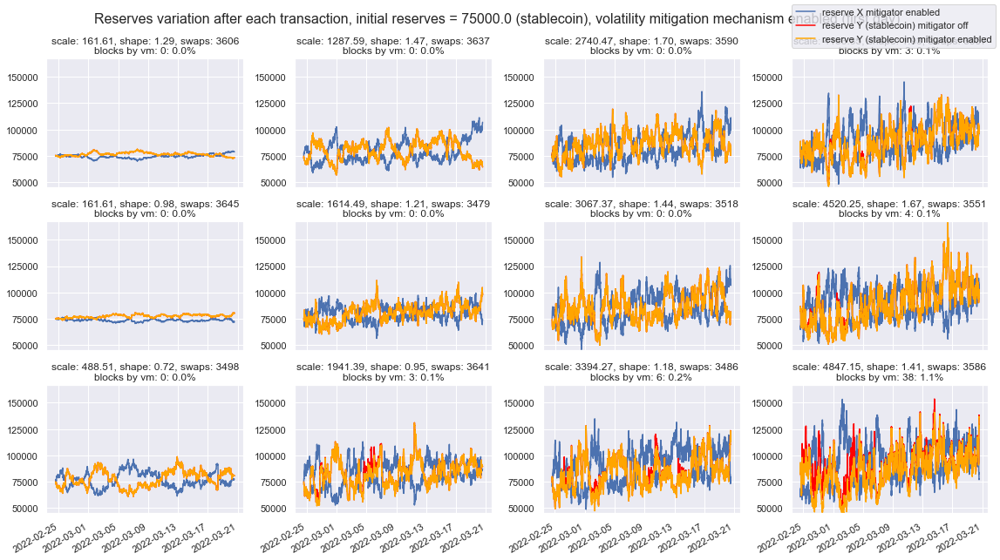

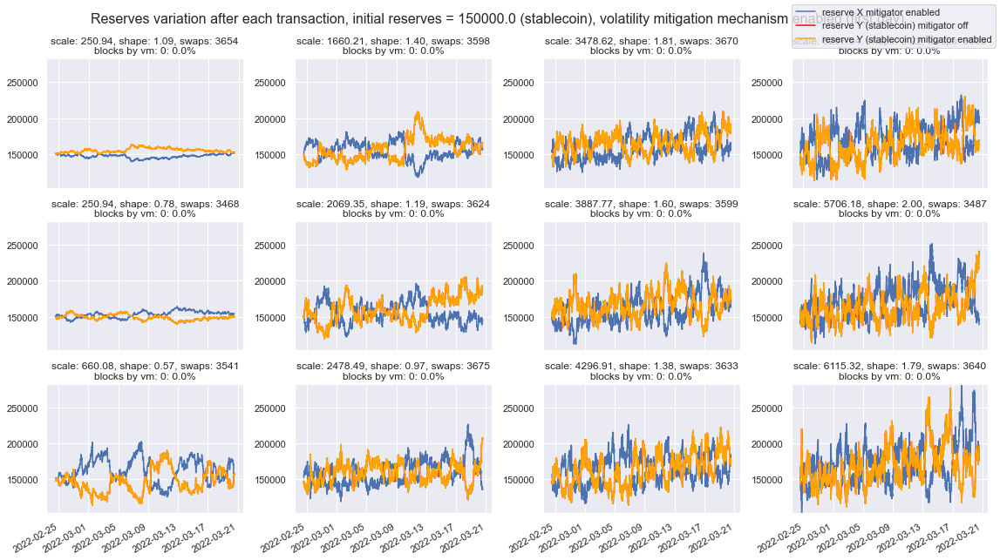

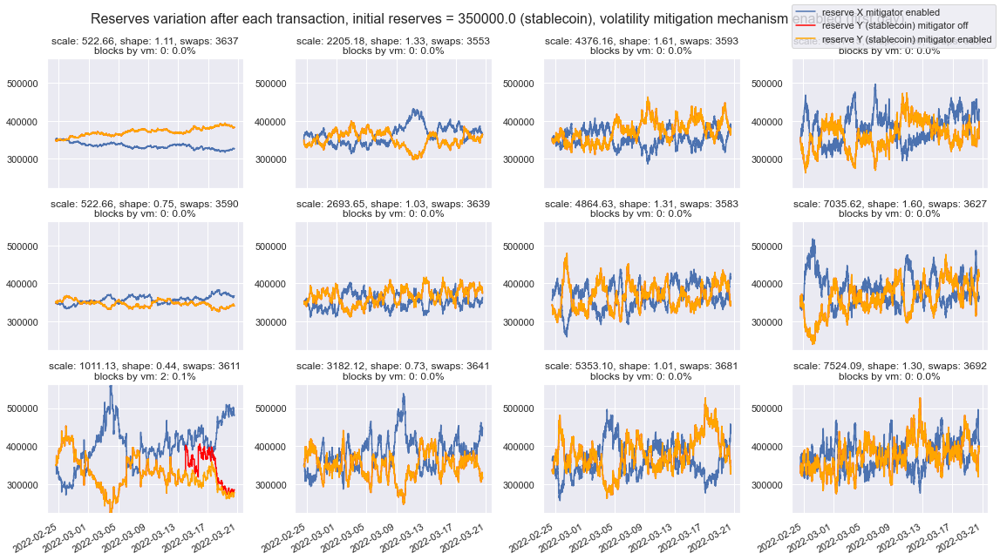

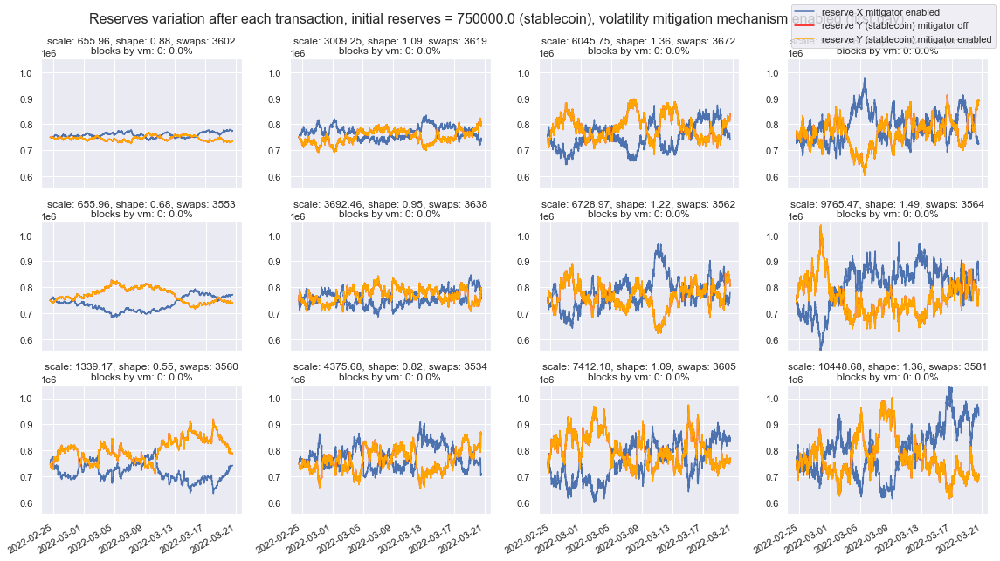

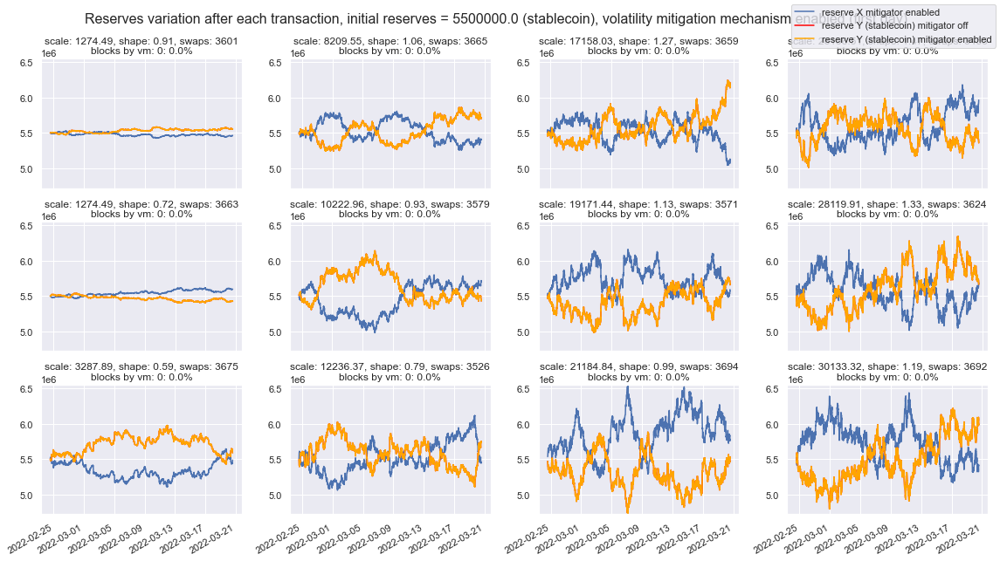

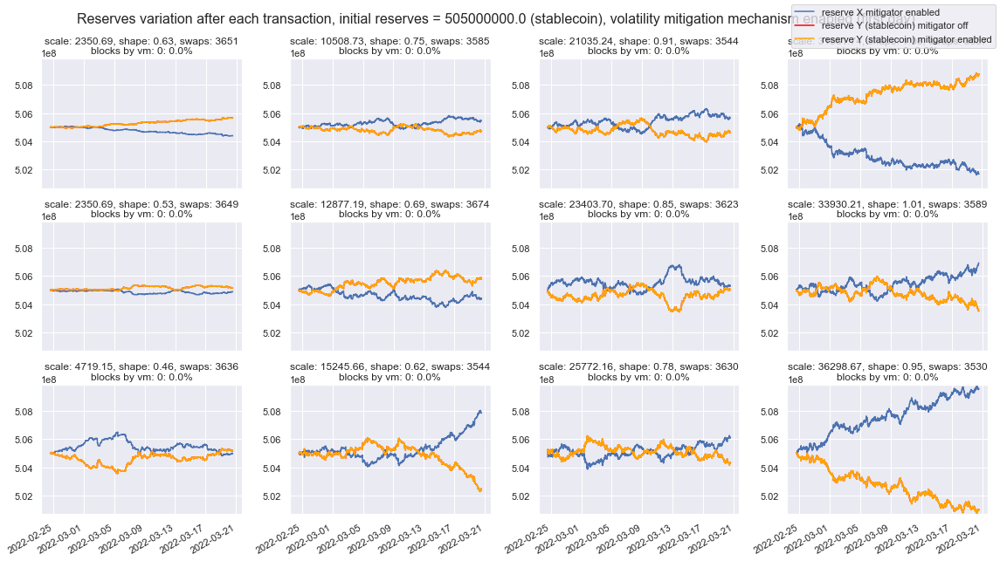

In [91]:
filtered_stats_df.sort_values(by=['initial_reserve_usd', 'scale', 'shape'], inplace=True, ascending=[True, True, False])
reserve_groups = filtered_stats_df.groupby('initial_reserve_usd')

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for name, curr_reserve_stats_df in reserve_groups:
        N = len(curr_reserve_stats_df)
        COLS = 4
        ROWS = N//COLS + (N%COLS != 0)

        fig, ax = plt.subplots(ROWS, COLS, figsize=(COLS*4, ROWS*3))
        axes = ax.ravel()
        axes = axes.reshape(ROWS, COLS).T.ravel()

        i = 0
        
        x_reserve_limits = [[simulations[row['sim_index'] - 1].reserve_X.min(), simulations[row['sim_index'] - 1].reserve_X.max()] for _, row in curr_reserve_stats_df.iterrows()]
        y_reserve_limits = [[simulations[row['sim_index'] - 1].reserve_Y.min(), simulations[row['sim_index'] - 1].reserve_Y.max()] for _, row in curr_reserve_stats_df.iterrows()]
        
        reserve_limits = np.concatenate([x_reserve_limits, y_reserve_limits])
      #  print(reserve_limits)
        y_axis_min, y_axis_max = reserve_limits.min(), reserve_limits.max()
        
        for index, row in curr_reserve_stats_df.iterrows():
            ax = axes[i]
            scale, shape, initial_reserves_usd, blocks, count = row['scale'], row['shape'], row['initial_reserve_usd'], row['blocked_transactions'], row['count']

            df0, df1 = simulations[row['sim_index'] - 1], simulations[row['sim_index']]
            plot_reserves(ax, df0, df1)
            #ax.set_xlim(simulations[row['sim_index'] - 1].transaction_timestamp.min(), simulations[row['sim_index'] - 1].transaction_timestamp.min() + datetime.timedelta(hours=24))
            show_title(ax, row, i==0)
            
            ax.set_ylim(y_axis_min, y_axis_max)

            i += 1

        fig.suptitle(f'Reserves variation after each transaction, initial reserves = {name} (stablecoin), volatility mitigation mechanism enabled (first day)', fontsize=16)
        fig.tight_layout()


In [92]:
def plot_blocked_datetime(ax, swaps0_df, swaps_df, scale, shape, blocks, count, is_first, resample_interval='1h'):
    success_df = swaps_df[swaps_df.status == 'SUCCESS']
    blocked_df = swaps_df[swaps_df.status != 'SUCCESS']
    
    blocked_df.index = blocked_df.transaction_timestamp
    success_df.index = success_df.transaction_timestamp
    
    success_s = success_df.resample(resample_interval).size()
    blocked_s = blocked_df.resample(resample_interval).size()
    
    ax.plot_date(x=success_s.index, y=success_s, linestyle='solid', marker=None, label='Success', color='green')
    ax.plot_date(x=blocked_s.index, y=blocked_s, linestyle='solid', marker=None, label='Blocked', color='red')

  #  ax.set_title(f'Variation of Price X ({X_NAME}) over time')
    #ax.set_ylim(0, 3)
    ax.set_xlabel('Time')
    ax.set_ylabel(Y_NAME)
    ax.set_title(f'scale = {scale}, shape = {shape}, blocks: {blocks} / {count}') #todo: iloc may differ from simulatuions df
    fig.autofmt_xdate()

    if is_first:
        fig.legend()

In [93]:
def plot_blocked_datetime(ax, swaps0_df, swaps_df,resample_interval='1h'):
    success_x_df = swaps_df[(swaps_df.status == 'SUCCESS') & ((swaps_df.token_in == 'X'))]
    success_y_df = swaps_df[(swaps_df.status == 'SUCCESS') & ((swaps_df.token_in == 'Y'))]
        
    blocked_x_df = swaps_df[(swaps_df.status != 'SUCCESS') & ((swaps_df.token_in == 'X'))]
    blocked_y_df = swaps_df[(swaps_df.status != 'SUCCESS') & ((swaps_df.token_in == 'Y'))]
    
    blocked_x_df.index = blocked_x_df.transaction_timestamp
    blocked_y_df.index = blocked_y_df.transaction_timestamp
    success_x_df.index = success_x_df.transaction_timestamp
    success_y_df.index = success_y_df.transaction_timestamp
    
    blocked_x_df.loc[success_y_df.index.max()] = None
    blocked_y_df.loc[success_y_df.index.max()] = None
    blocked_x_df.loc[success_y_df.index.min()] = None
    blocked_y_df.loc[success_y_df.index.min()] = None
    
    success_x_s = success_x_df.resample(resample_interval).size()
    success_y_s = success_y_df.resample(resample_interval).size()

    blocked_x_s = blocked_x_df.resample(resample_interval).size()
    blocked_y_s = blocked_y_df.resample(resample_interval).size()
    
    blocked_x_s.iloc[-1] -=1
    blocked_y_s.iloc[-1] -=1

    blocked_x_s.iloc[0] -=1
    blocked_y_s.iloc[0] -=1
    
    ratio_blocked_x = blocked_x_s / (success_x_s + blocked_x_s)
    ratio_blocked_y = blocked_y_s / (success_y_s + blocked_y_s)
    ratio_blocked_x[(success_x_s + blocked_x_s) == 0] = 0
    ratio_blocked_y[(success_y_s + blocked_y_s) == 0] = 0

    ax.plot_date(x=ratio_blocked_x.index, y=ratio_blocked_x, linestyle='solid', marker=None, label='in X', )
    ax.plot_date(x=ratio_blocked_y.index, y=ratio_blocked_y, linestyle='solid', marker=None, label='in Y', color='orange')

  #  ax.set_title(f'Variation of Price X ({X_NAME}) over time')
    #ax.set_ylim(0, 3)
    ax.set_xlabel('Time')
    ax.set_ylabel(Y_NAME)


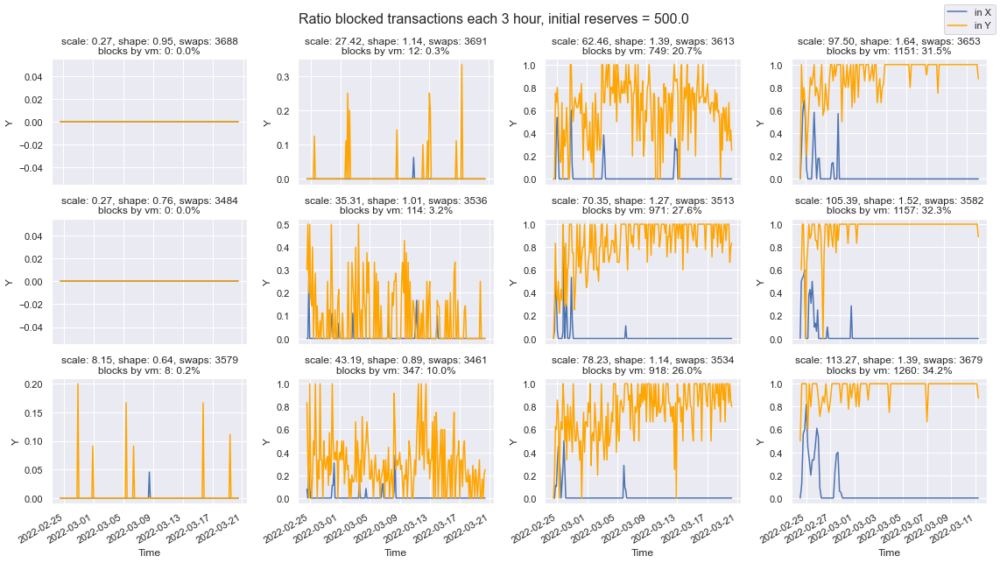

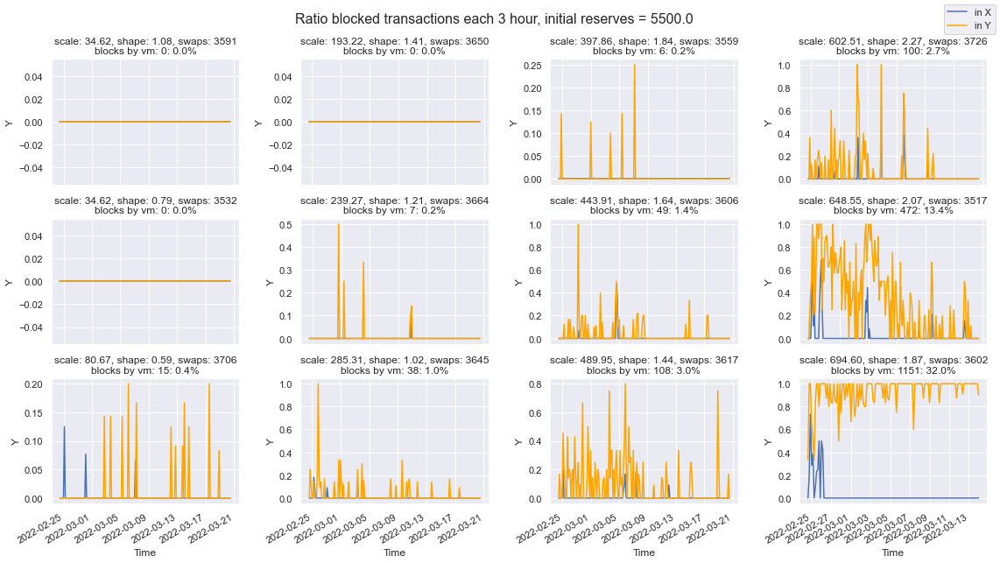

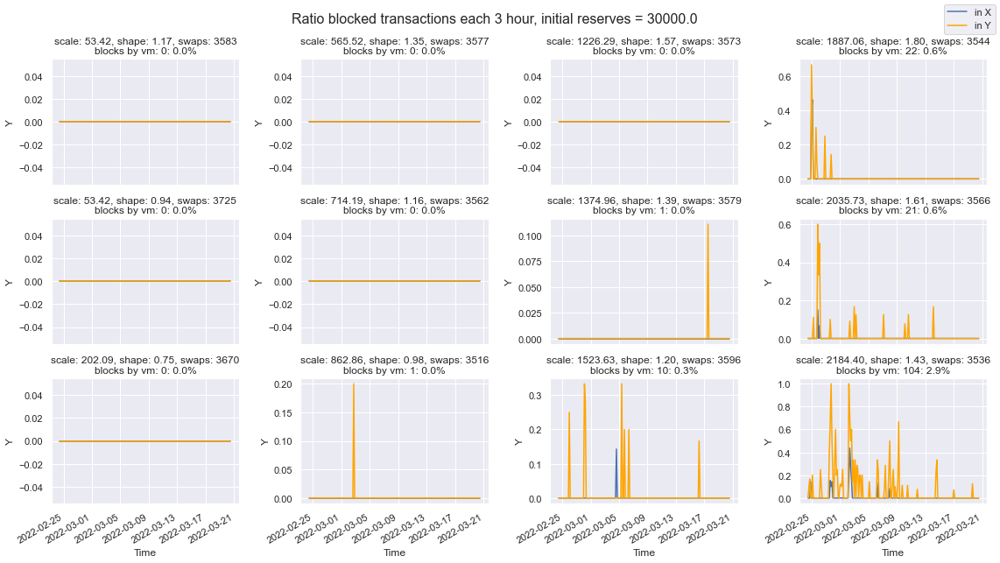

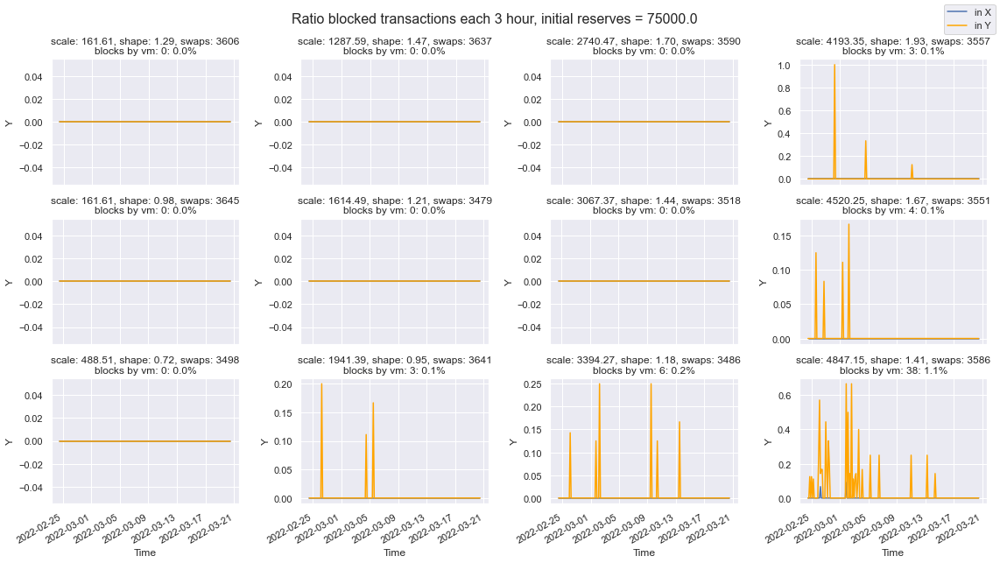

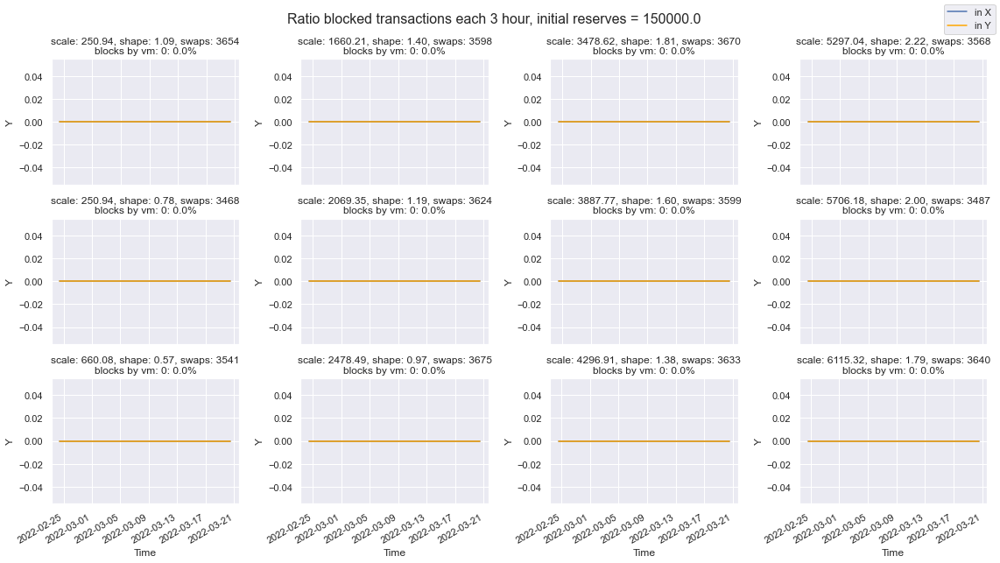

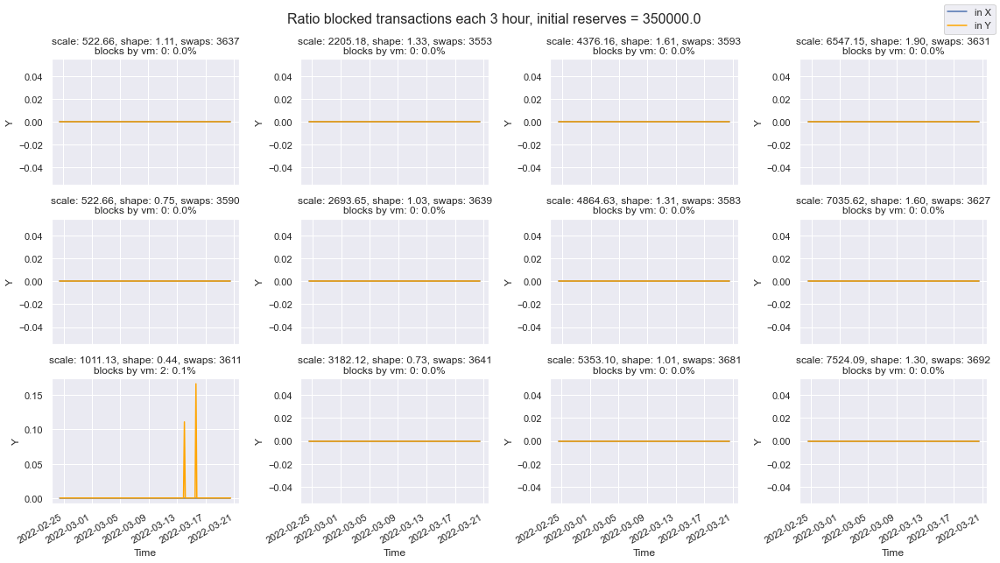

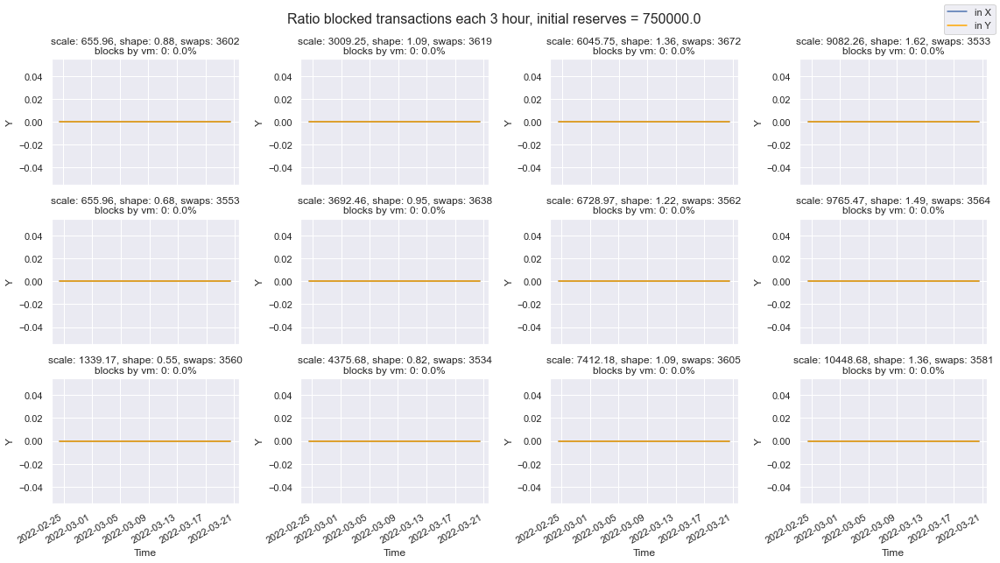

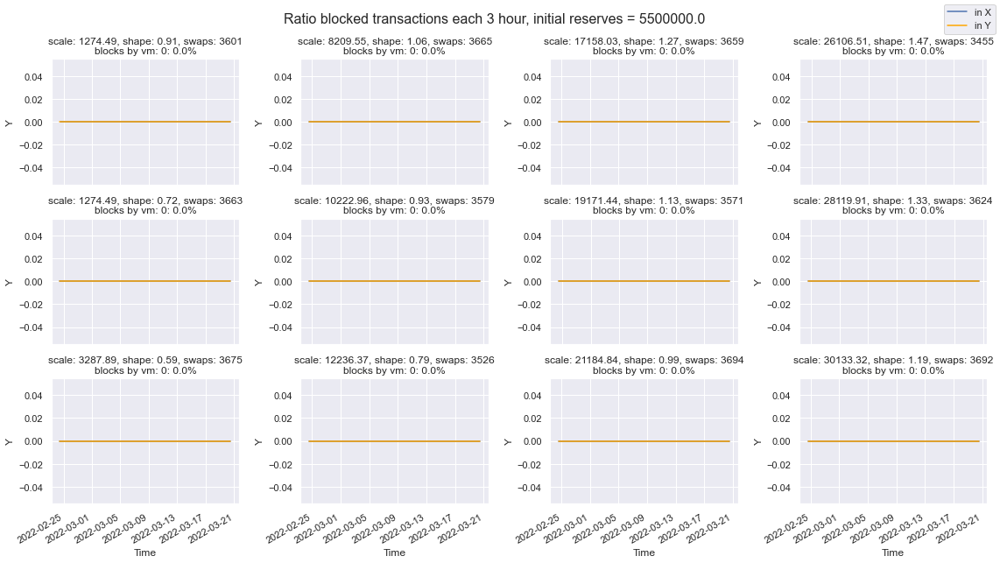

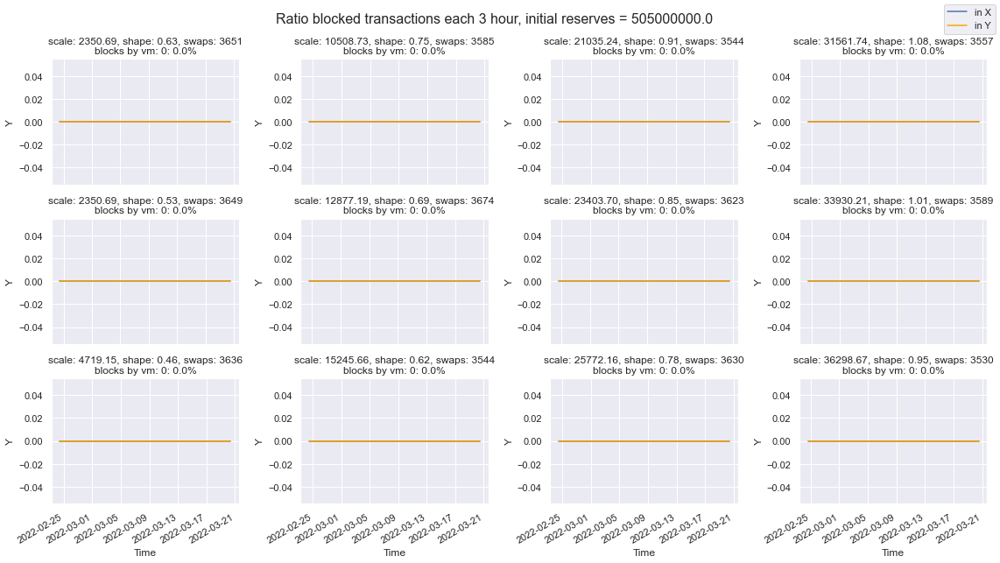

In [94]:
filtered_stats_df.sort_values(by=['initial_reserve_usd', 'scale', 'shape'], inplace=True, ascending=[True, True, False])
reserve_groups = filtered_stats_df.groupby('initial_reserve_usd')

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for name, curr_reserve_stats_df in reserve_groups:
        N = len(curr_reserve_stats_df)
        COLS = 4
        ROWS = N//COLS + (N%COLS != 0)

        fig, ax = plt.subplots(ROWS, COLS, figsize=(COLS*4, ROWS*3))
        axes = ax.ravel()
        axes = axes.reshape(ROWS, COLS).T.ravel()

        i = 0
        for index, row in curr_reserve_stats_df.iterrows():
            ax = axes[i]

            scale, shape, initial_reserves_usd, blocks, count = row['scale'], row['shape'], row['initial_reserve_usd'], row['blocked_transactions'], row['count']

            df0, df1 = simulations[row['sim_index'] - 1], simulations[row['sim_index']]
            plot_blocked_datetime(ax, df0, df1, '3h')
            show_title(ax, row, i==0)

            i += 1

        fig.suptitle(f'Ratio blocked transactions each 3 hour, initial reserves = {name}', fontsize=16)
        fig.tight_layout()
